In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import skew
from scipy.stats import boxcox
from scipy.stats import zscore
from scipy.stats import shapiro, kstest, normaltest
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from sklearn.cluster import DBSCAN
from mlxtend.frequent_patterns import apriori, association_rules
from mlxtend.frequent_patterns import fpgrowth
import networkx as nx
from matplotlib import cm

In [2]:
# Load the dataset
file_path = 'c:\\Users\\User\\Desktop\\Dissertation\\Dataset\\customer segmentation & market basket analysis_efm_ProcessedDataset.xlsx'
df = pd.read_excel(file_path, sheet_name="Dissertation.dbo.Dataset")

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 574855 entries, 0 to 574854
Data columns (total 10 columns):
 #   Column                       Non-Null Count   Dtype         
---  ------                       --------------   -----         
 0   order_id                     574855 non-null  object        
 1   customer_id                  574855 non-null  object        
 2   order_timestamp              574855 non-null  datetime64[ns]
 3   product_name                 574855 non-null  object        
 4   product_category             574855 non-null  object        
 5   product_price                574855 non-null  float64       
 6   items_sold                   574855 non-null  int64         
 7   geographical_region_of_user  574855 non-null  object        
 8   user_last_order_date         574855 non-null  datetime64[ns]
 9   f0_                          574855 non-null  datetime64[ns]
dtypes: datetime64[ns](3), float64(1), int64(1), object(5)
memory usage: 43.9+ MB


In [4]:
df.head()

,order_id,customer_id,order_timestamp,product_name,product_category,product_price,items_sold,geographical_region_of_user,user_last_order_date,f0_
0,77e907c181265b363e635da7bba13e8a,08b18b003542681939b50381abb2096d,2023-06-13 21:31:18,B&J Παγωτό Peaces Cookie Dough 10x6ml 465ml,Παγωτά,6.9,1,Αθήνα,2023-09-25,2014-12-22 15:44:48
1,7921fe8898686e4d69d85459a6a698a6,0ebd9ea8828edcbddcb492ebedceb181,2023-07-22 20:10:28,B&J Παγωτό Peaces Cookie Dough 10x6ml 465ml,Παγωτά Summer Shop,6.9,2,Αθήνα,2023-09-26,2018-11-28 19:20:33
2,796071f34371a962a0d83700a352939c,80fce0381eae5db3353ea7891936c7bc,2023-09-24 17:51:37,B&J Παγωτό Peaces Cookie Dough 10x6ml 465ml,Οικογενειακά & Ατομικά Παγωτά,6.9,1,Λάρισα,2023-09-30,2015-11-12 19:18:57
3,7a43588d729d0762509233a24f8c451a,f5d34e099fca111fe3644b8a2cfd98dd,2023-05-24 17:31:09,B&J Παγωτό Peaces Cookie Dough 10x6ml 465ml,Παγωτά,6.9,1,Αθήνα,2023-09-17,2015-07-22 18:17:35
4,7a75e6c937e21f276307ecf7e9b9ef1b,8bcb15e5e6f5c42fe93b0baeddeb5a81,2023-07-03 18:53:28,B&J Παγωτό Peaces Cookie Dough 10x6ml 465ml,Παγωτά,6.9,1,Αθήνα,2023-09-14,2016-05-02 14:39:42


In [5]:
# Get descriptive statistics for numerical columns
print(df.describe())

       product_price     items_sold
count  574855.000000  574855.000000
mean        3.070505       1.320065
std         2.526437       0.985945
min         0.000000       1.000000
25%         1.650000       1.000000
50%         2.400000       1.000000
75%         3.800000       1.000000
max        68.900000      60.000000


In [6]:
# Print the dataframe
print(df)

                                order_id                       customer_id  \
0       77e907c181265b363e635da7bba13e8a  08b18b003542681939b50381abb2096d   
1       7921fe8898686e4d69d85459a6a698a6  0ebd9ea8828edcbddcb492ebedceb181   
2       796071f34371a962a0d83700a352939c  80fce0381eae5db3353ea7891936c7bc   
3       7a43588d729d0762509233a24f8c451a  f5d34e099fca111fe3644b8a2cfd98dd   
4       7a75e6c937e21f276307ecf7e9b9ef1b  8bcb15e5e6f5c42fe93b0baeddeb5a81   
...                                  ...                               ...   
574850  fc5dae6f9e1b4c5d56ce6cfd5b34cce6  36edea1d0dc253998e6194b14c87f06a   
574851  fc7d72621659a5616a2ef70fbea8813f  3d7c4c44b01091dc49849697cddf9162   
574852  fcbf82b7a4980d618f96a77266689dec  0c3ce28a2e319676bcc4d20dfdb14fcf   
574853  fcdc1aa9c64ceb96d16d9422caef2407  7ad78d59f8b4b879b6bf93edbc8bee76   
574854  fce63af9476df4b18d2eb567030b7b21  af2d352f13a7c77eff25e2445d20adcc   

           order_timestamp                                     

In [7]:
# Display count of null values per column
null_summary = df.isnull().sum()
print(null_summary)


order_id                       0
customer_id                    0
order_timestamp                0
product_name                   0
product_category               0
product_price                  0
items_sold                     0
geographical_region_of_user    0
user_last_order_date           0
f0_                            0
dtype: int64


In [8]:
# Check how many 'NoName' values exist in 'product_name'
noname = (df['product_name'] == 'NoName').sum()
print(f"'NoName' product names after imputation: {noname}")


'NoName' product names after imputation: 91


In [9]:
# Number of unique values in categorical columns
print("Unique values in key columns:")
for col in ['product_name', 'product_category', 'customer_id', 'geographical_region_of_user']:
    print(f"{col}: {df[col].nunique()}")


Unique values in key columns:
product_name: 4044
product_category: 378
customer_id: 10000
geographical_region_of_user: 14


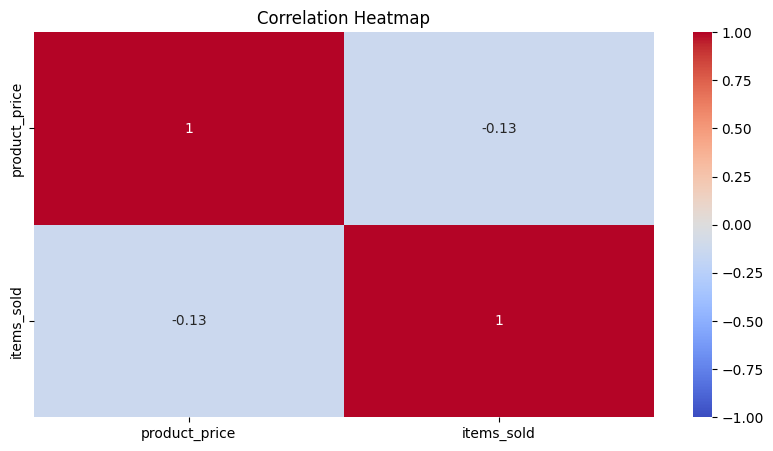

In [10]:
# Heatmap to visualize correlation between numerical variables
plt.figure(figsize=(10, 5))
sns.heatmap(df[['product_price', 'items_sold']].corr(), annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Heatmap')
plt.show()


In [11]:
# Drop the redundant 'f0_' column
sales_data = df.drop(columns=['f0_'])

# Verify that zero-priced products match 'Πρώτο Θέμα'
zero_price_products = sales_data[sales_data['product_price'] == 0]
mismatched_zero_price = zero_price_products[
    (zero_price_products['product_name'] != 'Πρώτο Θέμα') |
    (zero_price_products['product_category'] != 'Πρώτο Θέμα')
]

if mismatched_zero_price.empty:
    print("All zero-priced products match 'Πρώτο Θέμα'.")
else:
    print("There are mismatched zero-price entries:")
    print(mismatched_zero_price)

# Display the dataset info after dropping the column
print(sales_data.info())


All zero-priced products match 'Πρώτο Θέμα'.
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 574855 entries, 0 to 574854
Data columns (total 9 columns):
 #   Column                       Non-Null Count   Dtype         
---  ------                       --------------   -----         
 0   order_id                     574855 non-null  object        
 1   customer_id                  574855 non-null  object        
 2   order_timestamp              574855 non-null  datetime64[ns]
 3   product_name                 574855 non-null  object        
 4   product_category             574855 non-null  object        
 5   product_price                574855 non-null  float64       
 6   items_sold                   574855 non-null  int64         
 7   geographical_region_of_user  574855 non-null  object        
 8   user_last_order_date         574855 non-null  datetime64[ns]
dtypes: datetime64[ns](2), float64(1), int64(1), object(5)
memory usage: 39.5+ MB
None


RFM model implementation

In [12]:
# Convert 'order_timestamp' to datetime if not already
sales_data['order_timestamp'] = pd.to_datetime(sales_data['order_timestamp'])

# Create a reference date for recency calculations
reference_date = sales_data['order_timestamp'].max()

# Calculate RFM metrics
rfm_metrics = sales_data.groupby('customer_id').agg(
    recency=('order_timestamp', lambda x: (reference_date - x.max()).days),
    frequency=('order_id', 'nunique'),
    monetary=('product_price', 'sum')
).reset_index()

# Preview the RFM metrics
print(rfm_metrics.head())

# Save the RFM metrics dataset to a new CSV file
output_file = "RFM metrics_dataset.csv"
rfm_metrics.to_csv(output_file, index=False, float_format='%.2f', decimal=',')


                        customer_id  recency  frequency  monetary
0  00064944e8357c53d019070ea235429d       38          5     69.90
1  0006cf9f74f9add3c5f7500c2e18b298       48          1     12.17
2  000e9160aa41acd23928f68f5ee0793b       13         29    573.62
3  001097c31c4e02713fbfd65f69260f45        4          2     28.33
4  0012c94aa3e1ac552973b6f3a213602d       42          1     13.58


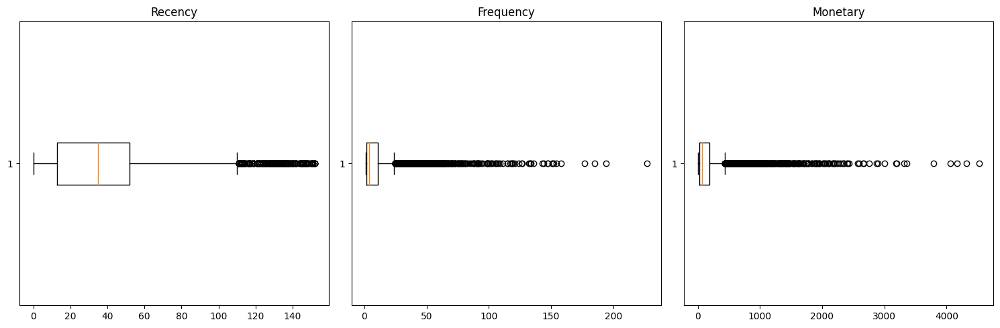

In [13]:
# Box plot for RFM metrics
fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharey=False)

# Box plots
metrics = ['recency', 'frequency', 'monetary']
titles = ['Recency', 'Frequency', 'Monetary']
for i, metric in enumerate(metrics):
    axes[i].boxplot(rfm_metrics[metric], vert=False)
    axes[i].set_title(titles[i])

plt.tight_layout()
plt.show()


In [14]:
# Calculate z-scores for RFM metrics
rfm_z_scores = rfm_metrics[['recency', 'frequency', 'monetary']].apply(
    lambda x: (x - x.mean()) / x.std()
)

# Identify outliers
outliers = (rfm_z_scores.abs() > 3).any(axis=1)
print(f"Number of outliers detected: {outliers.sum()}")


Number of outliers detected: 483


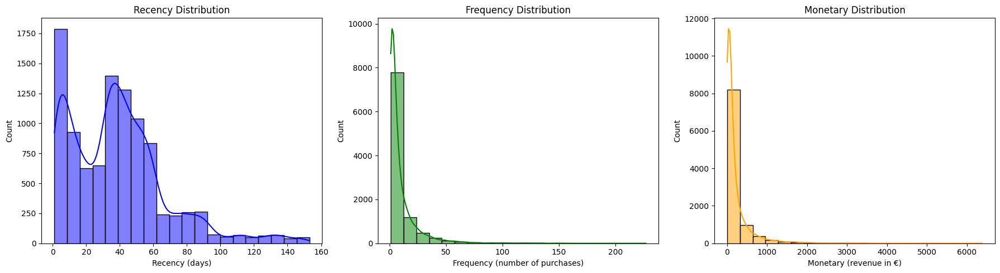

In [15]:
# Calculate RFM metrics directly from `df`

# Convert 'order_timestamp' to datetime if it is not already in datetime format
df['order_timestamp'] = pd.to_datetime(df['order_timestamp'])

# Create a reference date for calculating Recency (e.g., the day after the last transaction in the dataset)
reference_date = df['order_timestamp'].max() + pd.Timedelta(days=1)

# Calculate RFM metrics
rfm_metrics = df.groupby('customer_id').agg(
    recency=('order_timestamp', lambda x: (reference_date - x.max()).days),
    frequency=('order_id', 'nunique'),
    monetary=('product_price', lambda x: (x * df.loc[x.index, 'items_sold']).sum())
).reset_index()

# Plot histograms and kernel density plots for the calculated RFM metrics
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Plot Recency
sns.histplot(rfm_metrics['recency'], kde=True, ax=axes[0], color='blue', bins=20)
axes[0].set_title('Recency Distribution')
axes[0].set_xlabel('Recency (days)')

# Plot Frequency
sns.histplot(rfm_metrics['frequency'], kde=True, ax=axes[1], color='green', bins=20)
axes[1].set_title('Frequency Distribution')
axes[1].set_xlabel('Frequency (number of purchases)')

# Plot Monetary
sns.histplot(rfm_metrics['monetary'], kde=True, ax=axes[2], color='orange', bins=20)
axes[2].set_title('Monetary Distribution')
axes[2].set_xlabel('Monetary (revenue in €)')

plt.tight_layout()
plt.show()


In [16]:
# Calculate skewness for each RFM metric
recency_skewness = skew(rfm_metrics['recency'])
frequency_skewness = skew(rfm_metrics['frequency'])
monetary_skewness = skew(rfm_metrics['monetary'])

# Print skewness values
print(f"Recency Skewness: {recency_skewness:.2f}")
print(f"Frequency Skewness: {frequency_skewness:.2f}")
print(f"Monetary Skewness: {monetary_skewness:.2f}")


Recency Skewness: 1.11
Frequency Skewness: 4.39
Monetary Skewness: 5.18


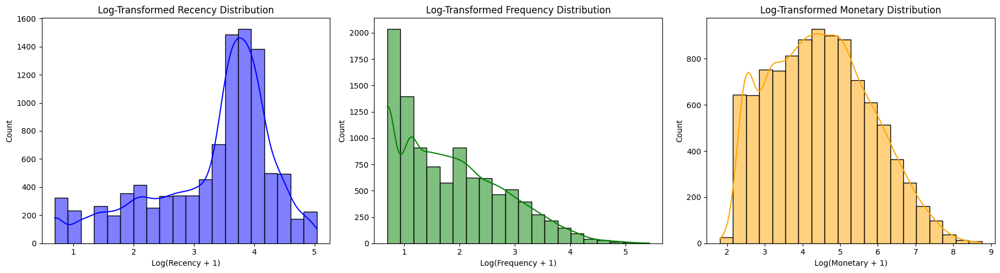

In [17]:
# Add 1 to all values to avoid issues with log(0)
rfm_metrics_log = rfm_metrics.copy()
rfm_metrics_log['recency'] = np.log1p(rfm_metrics['recency'])
rfm_metrics_log['frequency'] = np.log1p(rfm_metrics['frequency'])
rfm_metrics_log['monetary'] = np.log1p(rfm_metrics['monetary'])

# Visualize the distributions after logarithmic transformation
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Plot Log-Transformed Recency
sns.histplot(rfm_metrics_log['recency'], kde=True, ax=axes[0], color='blue', bins=20)
axes[0].set_title('Log-Transformed Recency Distribution')
axes[0].set_xlabel('Log(Recency + 1)')

# Plot Log-Transformed Frequency
sns.histplot(rfm_metrics_log['frequency'], kde=True, ax=axes[1], color='green', bins=20)
axes[1].set_title('Log-Transformed Frequency Distribution')
axes[1].set_xlabel('Log(Frequency + 1)')

# Plot Log-Transformed Monetary
sns.histplot(rfm_metrics_log['monetary'], kde=True, ax=axes[2], color='orange', bins=20)
axes[2].set_title('Log-Transformed Monetary Distribution')
axes[2].set_xlabel('Log(Monetary + 1)')

plt.tight_layout()
plt.show()


In [18]:
# Calculate skewness_log for each RFM metric
recency_skewness_log = skew(rfm_metrics_log['recency'])
frequency_skewness_log = skew(rfm_metrics_log['frequency'])
monetary_skewness_log = skew(rfm_metrics_log['monetary'])

# Print skewness_log values
print(f"Recency Skewness: {recency_skewness_log:.2f}")
print(f"Frequency Skewness: {frequency_skewness_log:.2f}")
print(f"Monetary Skewness: {monetary_skewness_log:.2f}")


Recency Skewness: -0.94
Frequency Skewness: 0.65
Monetary Skewness: 0.28


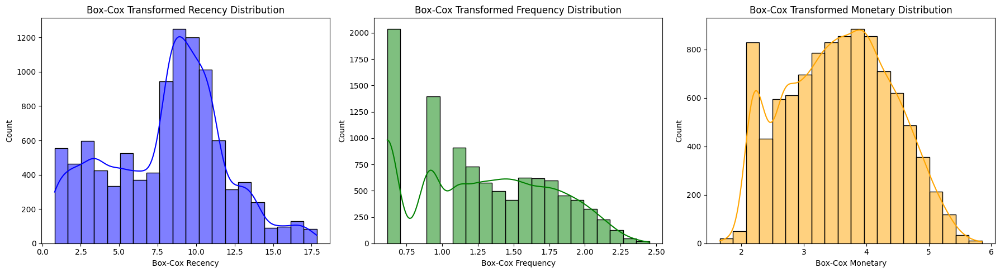

Recency Lambda: 0.43
Frequency Lambda: -0.35
Monetary Lambda: -0.10


In [19]:
# Copy the original RFM metrics for Box-Cox transformation
rfm_metrics_boxcox = rfm_metrics.copy()

# Add a small constant to ensure all values are positive
rfm_metrics_boxcox['recency'], recency_lambda = boxcox(rfm_metrics['recency'] + 1)
rfm_metrics_boxcox['frequency'], frequency_lambda = boxcox(rfm_metrics['frequency'] + 1)
rfm_metrics_boxcox['monetary'], monetary_lambda = boxcox(rfm_metrics['monetary'] + 1)

# Visualize the distributions after Box-Cox transformation
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Plot Box-Cox Transformed Recency
sns.histplot(rfm_metrics_boxcox['recency'], kde=True, ax=axes[0], color='blue', bins=20)
axes[0].set_title('Box-Cox Transformed Recency Distribution')
axes[0].set_xlabel('Box-Cox Recency')

# Plot Box-Cox Transformed Frequency
sns.histplot(rfm_metrics_boxcox['frequency'], kde=True, ax=axes[1], color='green', bins=20)
axes[1].set_title('Box-Cox Transformed Frequency Distribution')
axes[1].set_xlabel('Box-Cox Frequency')

# Plot Box-Cox Transformed Monetary
sns.histplot(rfm_metrics_boxcox['monetary'], kde=True, ax=axes[2], color='orange', bins=20)
axes[2].set_title('Box-Cox Transformed Monetary Distribution')
axes[2].set_xlabel('Box-Cox Monetary')

plt.tight_layout()
plt.show()

# Display the Box-Cox transformation parameters (lambdas)
print(f"Recency Lambda: {recency_lambda:.2f}")
print(f"Frequency Lambda: {frequency_lambda:.2f}")
print(f"Monetary Lambda: {monetary_lambda:.2f}")


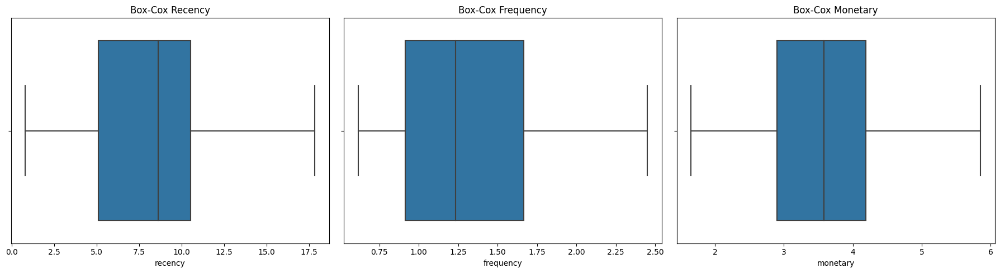

Outlier Summary:
recency      0
frequency    0
monetary     0
dtype: int64


In [20]:
# Calculate z-scores for the Box-Cox transformed metrics
rfm_z_scores = rfm_metrics_boxcox[['recency', 'frequency', 'monetary']].apply(zscore)

# Identify outliers (absolute z-score > 3)
outliers = (rfm_z_scores.abs() > 3)

# Count the number of outliers in each metric
outlier_summary = outliers.sum()

# Visualize the Box-Cox transformed metrics with outliers using box plots
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Box plots for transformed metrics
metrics = ['recency', 'frequency', 'monetary']
titles = ['Box-Cox Recency', 'Box-Cox Frequency', 'Box-Cox Monetary']
for i, metric in enumerate(metrics):
    sns.boxplot(x=rfm_metrics_boxcox[metric], ax=axes[i])
    axes[i].set_title(titles[i])

plt.tight_layout()
plt.show()

# Display the summary of outliers
print("Outlier Summary:")
print(outlier_summary)


In [21]:
# Perform normality tests on the Box-Cox transformed metrics
normality_results = {}

for metric in ['recency', 'frequency', 'monetary']:
    # Shapiro-Wilk Test
    shapiro_stat, shapiro_p = shapiro(rfm_metrics_boxcox[metric])
    
    # Kolmogorov-Smirnov Test
    ks_stat, ks_p = kstest(rfm_metrics_boxcox[metric], 'norm', 
                           args=(rfm_metrics_boxcox[metric].mean(), rfm_metrics_boxcox[metric].std()))
    
    # D'Agostino and Pearson's Test
    dagostino_stat, dagostino_p = normaltest(rfm_metrics_boxcox[metric])
    
    # Store results
    normality_results[metric] = {
        'Shapiro-Wilk': {'statistic': shapiro_stat, 'p-value': shapiro_p},
        'Kolmogorov-Smirnov': {'statistic': ks_stat, 'p-value': ks_p},
        'D\'Agostino-Pearson': {'statistic': dagostino_stat, 'p-value': dagostino_p}
    }

# Print the results
for metric, results in normality_results.items():
    print(f"\nNormality Test Results for {metric.capitalize()}:")
    for test, values in results.items():
        print(f"  {test}: Statistic = {values['statistic']:.4f}, p-value = {values['p-value']:.4f}")



Normality Test Results for Recency:
  Shapiro-Wilk: Statistic = 0.9740, p-value = 0.0000
  Kolmogorov-Smirnov: Statistic = 0.1048, p-value = 0.0000
  D'Agostino-Pearson: Statistic = 153.8225, p-value = 0.0000

Normality Test Results for Frequency:
  Shapiro-Wilk: Statistic = 0.9401, p-value = 0.0000
  Kolmogorov-Smirnov: Statistic = 0.1206, p-value = 0.0000
  D'Agostino-Pearson: Statistic = 3699.2678, p-value = 0.0000

Normality Test Results for Monetary:
  Shapiro-Wilk: Statistic = 0.9809, p-value = 0.0000
  Kolmogorov-Smirnov: Statistic = 0.0416, p-value = 0.0000
  D'Agostino-Pearson: Statistic = 987.3736, p-value = 0.0000


c:\Users\User\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_morestats.py:1800: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


In [22]:
# Step 1: Standardize the Box-Cox transformed RFM metrics
scaler = StandardScaler()
rfm_scaled = scaler.fit_transform(rfm_metrics_boxcox[['recency', 'frequency', 'monetary']])

# Step 2: Implement K-Means using the Forgy method for initialization
# (Random initialization from the dataset)
kmeans = KMeans(n_clusters=3, init='random', random_state=42)  # n_clusters can be adjusted as needed
kmeans.fit(rfm_scaled)

# Step 3: Add the cluster labels to the original dataset
rfm_metrics_boxcox['cluster'] = kmeans.labels_

# Step 4: Summarize the clustering results
# Inverse transform cluster centers to original scale
cluster_centers = scaler.inverse_transform(kmeans.cluster_centers_)
cluster_summary = pd.DataFrame(cluster_centers, columns=['recency', 'frequency', 'monetary'])
cluster_summary['cluster'] = range(1, len(cluster_summary) + 1)

# Output the results
print("Cluster Summary:")
print(cluster_summary)

# Save the dataset with clusters
rfm_metrics_boxcox.to_csv("rfm_with_clusters.csv", index=False)


Cluster Summary:
     recency  frequency  monetary  cluster
0   3.655641   1.803453  4.449909        1
1  10.510921   0.754504  2.644387        2
2   9.373713   1.367612  3.728455        3


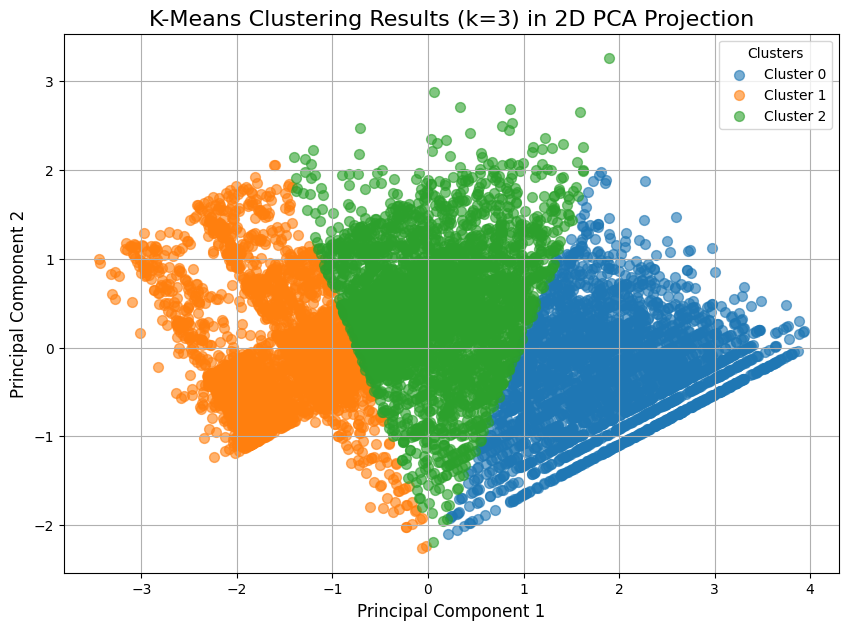

In [23]:
kmeans = KMeans(n_clusters=3, init='random', random_state=42)
kmeans.fit(rfm_scaled)
kmeans_labels = kmeans.labels_

# Step 2: Reduce dimensionality to 2D using PCA   ---Find source documention for PCA
pca = PCA(n_components=2)
rfm_2d = pca.fit_transform(rfm_scaled)

# Step 3: Create a scatter plot of the clusters
plt.figure(figsize=(10, 7))
unique_labels = set(kmeans_labels)

for label in unique_labels:
    plt.scatter(
        rfm_2d[kmeans_labels == label, 0],
        rfm_2d[kmeans_labels == label, 1],
        s=50,
        label=f'Cluster {label}',
        alpha=0.6
    )

# Step 4: Customize the plot
plt.title('K-Means Clustering Results (k=3) in 2D PCA Projection', fontsize=16)
plt.xlabel('Principal Component 1', fontsize=12)
plt.ylabel('Principal Component 2', fontsize=12)
plt.legend(title='Clusters', fontsize=10, loc='best')
plt.grid(True)
plt.show()


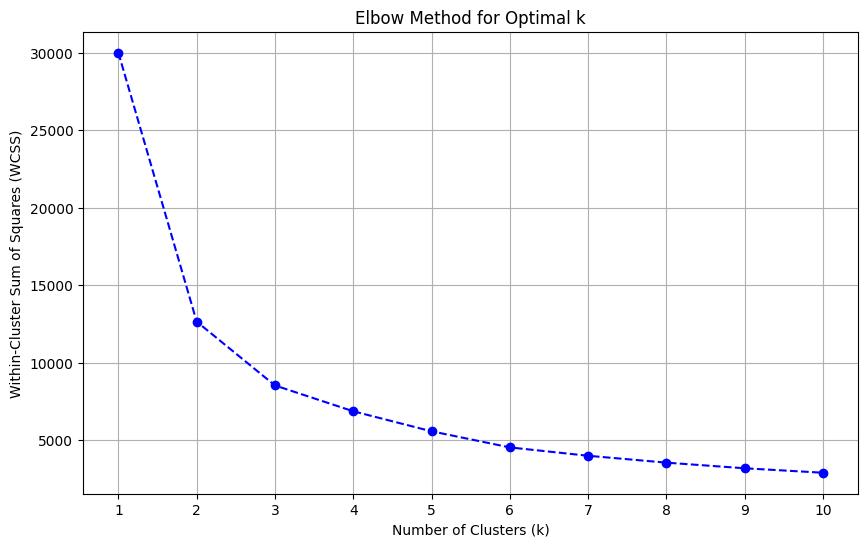

In [24]:
# Elbow Method to Determine Optimal Number of Clusters
wcss = []  # Within-Cluster Sum of Squares
k_values = range(1, 11)  # Test k from 1 to 10

for k in k_values:
    kmeans = KMeans(n_clusters=k, init='random', random_state=42)
    kmeans.fit(rfm_scaled)
    wcss.append(kmeans.inertia_)  # Append WCSS for each k

# Plot the Elbow Method graph
plt.figure(figsize=(10, 6))
plt.plot(k_values, wcss, marker='o', linestyle='--', color='b')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Within-Cluster Sum of Squares (WCSS)')
plt.xticks(k_values)
plt.grid()
plt.show()


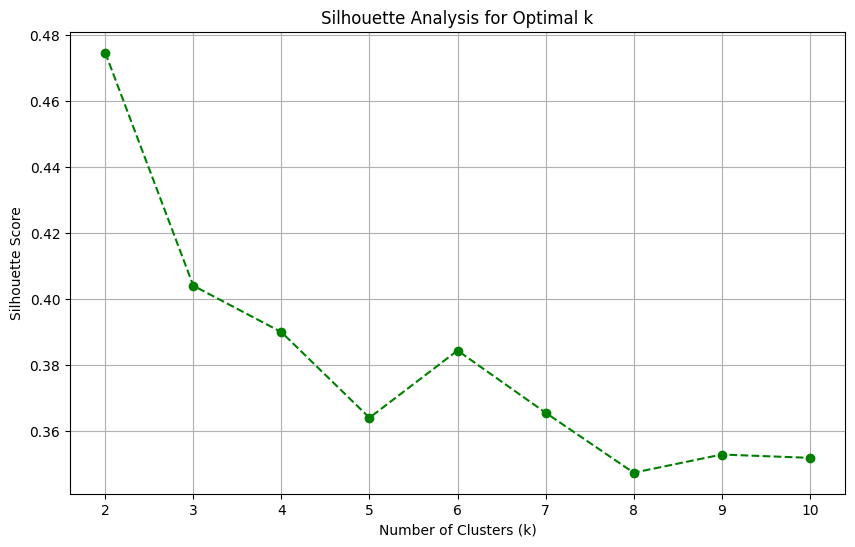

In [25]:
# Silhouette Analysis for Optimal Number of Clusters
silhouette_scores = []  # Store silhouette scores for each k
k_values = range(2, 11)  # Test k from 2 to 10

for k in k_values:
    kmeans = KMeans(n_clusters=k, init='random', random_state=42)  # Use Forgy method
    cluster_labels = kmeans.fit_predict(rfm_scaled)  # Predict cluster labels
    silhouette_avg = silhouette_score(rfm_scaled, cluster_labels)  # Calculate Silhouette Score
    silhouette_scores.append(silhouette_avg)

# Plot the Silhouette Scores
plt.figure(figsize=(10, 6))
plt.plot(k_values, silhouette_scores, marker='o', linestyle='--', color='g')
plt.title('Silhouette Analysis for Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.xticks(k_values)
plt.grid()
plt.show()


In [26]:
# Aligned Box Criterion (ABC) Implementation
def aligned_box_criterion(X, labels):
    """
    Aligned Box Criterion Implementation:
    X: Dataset
    labels: Cluster labels
    Returns: ABC Score
    """
    unique_labels = np.unique(labels)
    total_score = 0

    for cluster in unique_labels:
        cluster_points = X[labels == cluster]
        box_min = cluster_points.min(axis=0)
        box_max = cluster_points.max(axis=0)
        box_volume = np.prod(box_max - box_min)
        
        cluster_score = len(cluster_points) / box_volume  # Density of points within the box
        total_score += cluster_score

    return total_score / len(unique_labels)

# Step 1: Run K-Means for k=3
kmeans_k3 = KMeans(n_clusters=3, init='random', random_state=42)
kmeans_k3.fit(rfm_scaled)  # rfm_scaled contains the standardized RFM data

# Step 2: Calculate ABC Score for k=3
labels_k3 = kmeans_k3.labels_  # Get cluster labels
abc_score_k3 = aligned_box_criterion(rfm_scaled, labels_k3)

# Step 3: Print the ABC Score for k=3
print(f"Aligned Box Criterion (ABC) Score for k=3: {abc_score_k3:.4f}")


Aligned Box Criterion (ABC) Score for k=3: 132.2817


Implement DBSCAN algorithm

In [27]:
# Step 1: Implement DBSCAN

# Parameters: eps (neighborhood size) and min_samples (minimum points to form a cluster)
eps_value = 0.3  # Set the desired eps value
min_samples_value = 5  # Set the desired min_samples value
dbscan = DBSCAN(eps=eps_value, min_samples=min_samples_value)  # Adjust these values as needed for better results
dbscan.fit(rfm_scaled)  # rfm_scaled contains the standardized RFM metrics

# Step 2: Extract cluster labels
dbscan_labels = dbscan.labels_

# Step 3: Count the number of clusters (ignoring noise points labeled as -1)
n_clusters_dbscan = len(set(dbscan_labels)) - (1 if -1 in dbscan_labels else 0)
n_noise_points = list(dbscan_labels).count(-1)

# Step 4: Compute silhouette score (only if more than 1 cluster is formed)
if n_clusters_dbscan > 1:
    silhouette_avg_dbscan = silhouette_score(rfm_scaled, dbscan_labels)
else:
    silhouette_avg_dbscan = "Not Applicable (only one cluster formed)"

# Step 5: Append DBSCAN cluster labels to the dataset
rfm_metrics_boxcox['dbscan_cluster'] = dbscan_labels

# Display the DBSCAN results summary with parameters
dbscan_results = {
    "Eps (Neighborhood Size)": eps_value,
    "Min Samples": min_samples_value,
    "Number of Clusters (excluding noise)": n_clusters_dbscan,
    "Number of Noise Points": n_noise_points,
    "Silhouette Score": silhouette_avg_dbscan,
}
print("DBSCAN Clustering Results:")
print(pd.DataFrame([dbscan_results]).to_string())

# Save the dataset with DBSCAN cluster labels for further analysis
rfm_metrics_boxcox.to_csv("rfm_with_dbscan_clusters.csv", index=False)


DBSCAN Clustering Results:
   Eps (Neighborhood Size)  Min Samples  Number of Clusters (excluding noise)  Number of Noise Points  Silhouette Score
0                      0.3            5                                     5                      40           0.18041


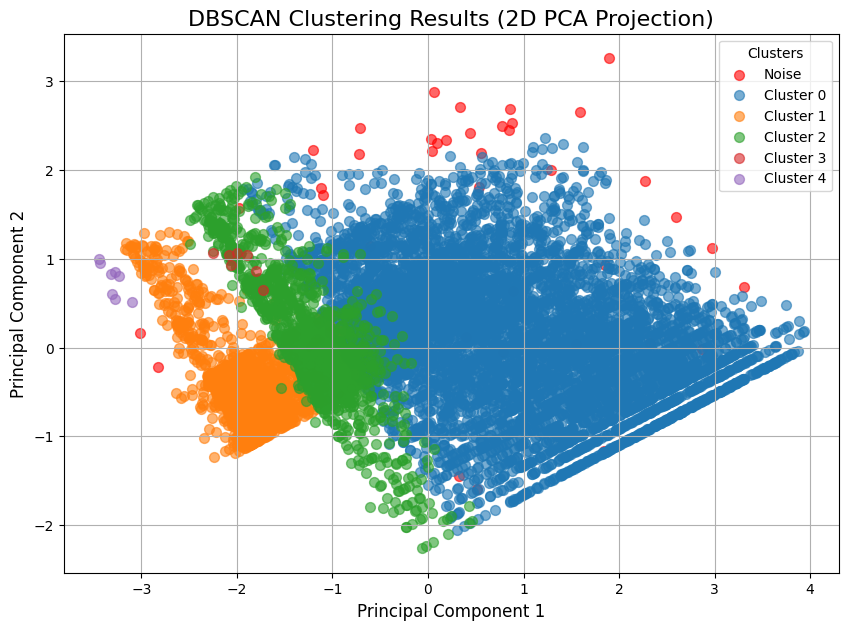

In [28]:
# Step 1: Reduce dimensionality to 2D using PCA
pca = PCA(n_components=2)
rfm_2d = pca.fit_transform(rfm_scaled)

# Step 2: Create a scatter plot of the clusters
plt.figure(figsize=(10, 7))
unique_labels = np.unique(dbscan_labels)

for label in unique_labels:
    if label == -1:  # Noise points
        plt.scatter(
            rfm_2d[dbscan_labels == label, 0],
            rfm_2d[dbscan_labels == label, 1],
            s=50,
            c='red',
            label='Noise',
            alpha=0.6
        )
    else:
        plt.scatter(
            rfm_2d[dbscan_labels == label, 0],
            rfm_2d[dbscan_labels == label, 1],
            s=50,
            label=f'Cluster {label}',
            alpha=0.6
        )

# Step 3: Customize plot
plt.title('DBSCAN Clustering Results (2D PCA Projection)', fontsize=16)
plt.xlabel('Principal Component 1', fontsize=12)
plt.ylabel('Principal Component 2', fontsize=12)
plt.legend(title='Clusters', fontsize=10, loc='best')
plt.grid(True)
plt.show()


In [29]:
# Define a function to visualize DBSCAN results
def visualize_dbscan_clusters(rfm_scaled, labels, eps, min_samples):
    from sklearn.decomposition import PCA
    pca = PCA(n_components=2)
    rfm_2d = pca.fit_transform(rfm_scaled)
    
    unique_labels = np.unique(labels)
    plt.figure(figsize=(10, 7))
    
    for label in unique_labels:
        if label == -1:  # Noise
            plt.scatter(rfm_2d[labels == label, 0], rfm_2d[labels == label, 1], 
                        s=50, c='red', label='Noise', alpha=0.6)
        else:
            plt.scatter(rfm_2d[labels == label, 0], rfm_2d[labels == label, 1], 
                        s=50, label=f'Cluster {label}', alpha=0.6)
    
    plt.title(f'DBSCAN Clustering Results (eps={eps}, min_samples={min_samples})', fontsize=16)
    plt.xlabel('Principal Component 1', fontsize=12)
    plt.ylabel('Principal Component 2', fontsize=12)
    plt.legend(title='Clusters', fontsize=10, loc='best')
    plt.grid(True)
    plt.show()

# Grid search for eps and min_samples
eps_values = [0.3, 0.4, 0.5, 0.6]  # Test smaller eps values
min_samples_values = [3, 5, 7]  # Test stricter min_samples

for eps in eps_values:
    for min_samples in min_samples_values:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        dbscan.fit(rfm_scaled)
        labels = dbscan.labels_
        
        # Count clusters (excluding noise)
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        n_noise = list(labels).count(-1)
        
        print(f"eps={eps}, min_samples={min_samples}: {n_clusters} clusters, {n_noise} noise points")
        
        # Visualize if 3 clusters are formed
        if n_clusters == 3:
            visualize_dbscan_clusters(rfm_scaled, labels, eps, min_samples)


eps=0.3, min_samples=3: 6 clusters, 25 noise points
eps=0.3, min_samples=5: 5 clusters, 40 noise points
eps=0.3, min_samples=7: 4 clusters, 57 noise points
eps=0.4, min_samples=3: 2 clusters, 6 noise points
eps=0.4, min_samples=5: 2 clusters, 9 noise points
eps=0.4, min_samples=7: 2 clusters, 14 noise points
eps=0.5, min_samples=3: 2 clusters, 3 noise points
eps=0.5, min_samples=5: 2 clusters, 3 noise points
eps=0.5, min_samples=7: 2 clusters, 4 noise points
eps=0.6, min_samples=3: 2 clusters, 2 noise points
eps=0.6, min_samples=5: 2 clusters, 2 noise points
eps=0.6, min_samples=7: 2 clusters, 2 noise points


After having examined K-means and DBSCAN results, we decided to keep K-means output. Now we will analyze the 3 created clusters

In [30]:
# Step 1: Standardize the RFM metrics
scaler = StandardScaler()
rfm_scaled = scaler.fit_transform(rfm_metrics_boxcox[['recency', 'frequency', 'monetary']])

# Step 2: Implement K-Means using the Forgy method for initialization
kmeans = KMeans(n_clusters=3, init='random', random_state=42)  # Adjust n_clusters if needed
kmeans.fit(rfm_scaled)

# Step 3: Add the cluster labels to the original dataset
rfm_metrics_boxcox['cluster'] = kmeans.labels_

# Step 4: Summarize the clustering results
# Inverse transform cluster centers to the original scale
cluster_centers = scaler.inverse_transform(kmeans.cluster_centers_)
cluster_summary = pd.DataFrame(cluster_centers, columns=['recency', 'frequency', 'monetary'])
cluster_summary['cluster'] = range(1, len(cluster_summary) + 1)

# Step 5: Add customer count and percentage
cluster_counts = rfm_metrics_boxcox['cluster'].value_counts().sort_index()
cluster_summary['customer_count'] = cluster_counts.values
cluster_summary['percentage'] = (cluster_counts.values / cluster_counts.sum()) * 100

# Step 6: Apply conditional formatting
# Calculate averages
average_recency = cluster_summary['recency'].mean()
average_frequency = cluster_summary['frequency'].mean()
average_monetary = cluster_summary['monetary'].mean()

# Add conditional formatting (as an additional column for display)
cluster_summary['recency_color'] = cluster_summary['recency'].apply(
    lambda x: 'green' if x < average_recency else 'red'
)
cluster_summary['frequency_color'] = cluster_summary['frequency'].apply(
    lambda x: 'green' if x > average_frequency else 'red'
)
cluster_summary['monetary_color'] = cluster_summary['monetary'].apply(
    lambda x: 'green' if x > average_monetary else 'red'
)

# Round RFM variables to 2 decimal places for readability
cluster_summary[['recency', 'frequency', 'monetary']] = cluster_summary[['recency', 'frequency', 'monetary']].round(2)

# Step 7: Save or display the cluster summary table
cluster_summary_file = "cluster_summary.csv"
cluster_summary.to_csv(cluster_summary_file, index=False)

# Print confirmation
print(f"Cluster summary saved to {cluster_summary_file}")


Cluster summary saved to cluster_summary.csv


In [31]:
# Adjust cluster numbering to start from 1 instead of 0
rfm_metrics_boxcox['cluster_label'] = rfm_metrics_boxcox['cluster'] + 1

# Round RFM values to two decimal places for better readability
rfm_metrics_boxcox[['recency', 'frequency', 'monetary']] = rfm_metrics_boxcox[['recency', 'frequency', 'monetary']].round(2)

# Merge the corrected RFM metrics and clusters back into the original dataset
final_dataset = pd.merge(
    df, 
    rfm_metrics_boxcox[['customer_id', 'recency', 'frequency', 'monetary', 'cluster_label']],
    on='customer_id',
    how='left'
)

# Save the CSV file with a comma as the decimal separator
output_file = "full_dataset_with_clusters_corrected.csv"
final_dataset.to_csv(output_file, index=False, float_format='%.2f', decimal=',')

# Print confirmation and preview of the corrected dataset
print(f"Updated dataset saved with corrected cluster labels and rounded RFM values to {output_file}")
print(final_dataset.head().to_string())


Updated dataset saved with corrected cluster labels and rounded RFM values to full_dataset_with_clusters_corrected.csv
                           order_id                       customer_id     order_timestamp                                 product_name               product_category  product_price  items_sold geographical_region_of_user user_last_order_date                 f0_  recency  frequency  monetary  cluster_label
0  77e907c181265b363e635da7bba13e8a  08b18b003542681939b50381abb2096d 2023-06-13 21:31:18  B&J Παγωτό Peaces Cookie Dough 10x6ml 465ml                         Παγωτά            6.9           1                       Αθήνα           2023-09-25 2014-12-22 15:44:48     3.04       2.12      5.11              1
1  7921fe8898686e4d69d85459a6a698a6  0ebd9ea8828edcbddcb492ebedceb181 2023-07-22 20:10:28  B&J Παγωτό Peaces Cookie Dough 10x6ml 465ml             Παγωτά Summer Shop            6.9           2                       Αθήνα           2023-09-26 2018-11-28 19:20:33     2

In [32]:
# Retain the original RFM values
rfm_metrics_original = rfm_metrics.copy()
rfm_metrics_original.columns = ['customer_id', 'recency_original', 'frequency_original', 'monetary_original']

# Add cluster_label column, starting from 1 instead of 0
rfm_metrics_boxcox['cluster_label'] = rfm_metrics_boxcox['cluster'] + 1

# Merge the original RFM metrics with the Box-Cox transformed data
rfm_combined = pd.merge(
    rfm_metrics_original,
    rfm_metrics_boxcox[['customer_id', 'recency', 'frequency', 'monetary', 'cluster_label']],
    on='customer_id',
    how='left'
)

# Merge the combined RFM data with the original dataset
final_dataset_corrected = pd.merge(
    df,
    rfm_combined,
    on='customer_id',
    how='left'
)

# Save the corrected dataset
output_file = "full_dataset_with_original_and_transformed_RFM.csv"
final_dataset_corrected.to_csv(output_file, index=False, float_format='%.2f', decimal=',')

# Print confirmation and preview of the corrected dataset
print(f"Final dataset saved to {output_file}")
print(final_dataset_corrected.head().to_string())


Final dataset saved to full_dataset_with_original_and_transformed_RFM.csv
                           order_id                       customer_id     order_timestamp                                 product_name               product_category  product_price  items_sold geographical_region_of_user user_last_order_date                 f0_  recency_original  frequency_original  monetary_original  recency  frequency  monetary  cluster_label
0  77e907c181265b363e635da7bba13e8a  08b18b003542681939b50381abb2096d 2023-06-13 21:31:18  B&J Παγωτό Peaces Cookie Dough 10x6ml 465ml                         Παγωτά            6.9           1                       Αθήνα           2023-09-25 2014-12-22 15:44:48                 6                  45            1256.75     3.04       2.12      5.11              1
1  7921fe8898686e4d69d85459a6a698a6  0ebd9ea8828edcbddcb492ebedceb181 2023-07-22 20:10:28  B&J Παγωτό Peaces Cookie Dough 10x6ml 465ml             Παγωτά Summer Shop            6.9           2      

In [33]:
# Adjust pandas display settings to show all columns in one line
pd.set_option('display.width', None)  # Disable width limitation
pd.set_option('display.max_columns', None)  # Show all columns
pd.set_option('display.max_rows', None)  # Ensure all rows are displayed
pd.set_option('display.max_colwidth', None)  # Prevent column text from being truncated

# Read the dataset
file_path = 'c:\\Users\\User\\Desktop\\Dissertation\\RFM_FinalDataset.csv'
fd = pd.read_csv(file_path)

# Display the first 5 rows of the dataframe, showing all columns in one line
print(fd.head().to_string(index=False))  # Use to_string() to display in one line without index



                        order_id                      customer_id     order_timestamp                                product_name              product_category product_price  items_sold geographical_region_of_user user_last_order_date                 f0_  recency_original  frequency_original monetary_original recency frequency monetary  cluster_label
77e907c181265b363e635da7bba13e8a 08b18b003542681939b50381abb2096d 2023-06-13 21:31:18 B&J Παγωτό Peaces Cookie Dough 10x6ml 465ml                        Παγωτά          6,90           1                       Αθήνα           2023-09-25 2014-12-22 15:44:48                 5                  45           1093,81    3,04      2,12     5,11              1
7921fe8898686e4d69d85459a6a698a6 0ebd9ea8828edcbddcb492ebedceb181 2023-07-22 20:10:28 B&J Παγωτό Peaces Cookie Dough 10x6ml 465ml            Παγωτά Summer Shop          6,90           2                       Αθήνα           2023-09-26 2018-11-28 19:20:33                 4                  28  

In [34]:
fd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 574855 entries, 0 to 574854
Data columns (total 17 columns):
 #   Column                       Non-Null Count   Dtype 
---  ------                       --------------   ----- 
 0   order_id                     574855 non-null  object
 1   customer_id                  574855 non-null  object
 2   order_timestamp              574855 non-null  object
 3   product_name                 574855 non-null  object
 4   product_category             574855 non-null  object
 5   product_price                574855 non-null  object
 6   items_sold                   574855 non-null  int64 
 7   geographical_region_of_user  574855 non-null  object
 8   user_last_order_date         574855 non-null  object
 9   f0_                          574855 non-null  object
 10  recency_original             574855 non-null  int64 
 11  frequency_original           574855 non-null  int64 
 12  monetary_original            574855 non-null  object
 13  recency       

In [35]:
# Create a transaction dataset with 'order_id' and 'product_name'
transactions = fd.groupby('order_id')['product_name'].apply(list).reset_index(name='products')

# One-hot encode the transaction data
from mlxtend.preprocessing import TransactionEncoder

te = TransactionEncoder()
te_ary = te.fit(transactions['products']).transform(transactions['products'])
df_encoded = pd.DataFrame(te_ary, columns=te.columns_)


Apriori algorithm

The following code cell is commented out because it cannot run due to memory restriction

In [36]:
# frequent_itemsets_apriori = apriori(df_encoded, min_support=0.003, use_colnames=True)

# # Check if itemsets are generated
# if not frequent_itemsets_apriori.empty:
#     # Generate association rules using num_itemsets
#     rules_apriori = association_rules(frequent_itemsets_apriori, metric="confidence", min_threshold=0.1, num_itemsets=len(frequent_itemsets_apriori))
#     print(rules_apriori.head().to_string())
# else:
#     print("No frequent itemsets found. Try lowering the support threshold.")



We reduce the dataset size by focusing on top 100 frequently purchased products to save memory:

In [37]:
top_products = fd['product_name'].value_counts().head(100).index
filtered_data = fd[fd['product_name'].isin(top_products)]

# Create transactions and re-encode
transactions_filtered = filtered_data.groupby('order_id')['product_name'].apply(list).reset_index(name='products')
te_ary = te.fit(transactions_filtered['products']).transform(transactions_filtered['products'])
df_encoded_filtered = pd.DataFrame(te_ary, columns=te.columns_)

# Run Apriori on the reduced dataset
frequent_itemsets_filtered = apriori(df_encoded_filtered, min_support=0.001, use_colnames=True)
rules_filtered = association_rules(frequent_itemsets_filtered, metric="confidence", min_threshold=0.005, num_itemsets=len(frequent_itemsets_filtered))
print(rules_filtered.to_string())


                                                                                                               antecedents                                                                                                            consequents  antecedent support  consequent support   support  confidence       lift  representativity  leverage  conviction  zhangs_metric   jaccard  certainty  kulczynski
0                                                                                   (Magic Παγωτό Πύραυλος Αμύγδαλο 160ml)                                                                                 (Algida Παγωτό Sandwich Vanilla 100ml)            0.013890            0.017312  0.001665    0.119867   6.923990               1.0  0.001424    1.116522       0.867626  0.056367   0.104362    0.108019
1                                                                                   (Algida Παγωτό Sandwich Vanilla 100ml)                                                                        

Explore findings:

In [38]:
# Display top 10 itemsets with higher support
print(frequent_itemsets_filtered.sort_values(by='support', ascending=False).head(10))


     support                                                      itemsets
87  0.066226                                (Μπανάνες Ελάχιστο Βάρος 800g)
23  0.055234                 (Endless Economy Ρολό Κουζίνας 2 Φύλλων 800g)
25  0.049161             (Endless Rich & Soft Χαρτί Υγείας 3 Φύλλων 10τεμ)
71  0.047557                                              (Αύρα Νερό 1,5l)
72  0.046447                                             (Αύρα Νερό 500ml)
15  0.044952                                         (Coca-Cola Zero 1.5l)
68  0.035811                    (Όλυμπος Επιλεγμένο Φρέσκο Γάλα Πλήρες 1l)
16  0.035117                                        (Coca-Cola Zero 330ml)
80  0.030600                        (Καραμολέγκος Ψωμί Τοστ Σταρένιο 680g)
75  0.029321  (Δάμα Ντοματίνια Βελανίδια Συσκευασμένα Ελάχιστο Βάρος 250g)


In [39]:
#Display all itemsets with support > 0.02
high_support_itemsets = frequent_itemsets_filtered[frequent_itemsets_filtered['support'] > 0.02]
print(high_support_itemsets)


     support  \
6   0.022676   
11  0.020827   
12  0.023987   
15  0.044952   
16  0.035117   
19  0.028380   
23  0.055234   
25  0.049161   
27  0.021613   
30  0.023000   
33  0.023170   
45  0.020950   
50  0.025313   
52  0.020549   
56  0.020040   
67  0.027671   
68  0.035811   
71  0.047557   
72  0.046447   
74  0.020981   
75  0.029321   
79  0.020642   
80  0.030600   
82  0.022800   
87  0.066226   
88  0.028935   
96  0.026068   
98  0.023971   
99  0.020565   

                                                                           itemsets  
6   (Bio Delicious Μπανάνες Εισαγωγής Βιολογικές Συσκευασμένες Ελάχιστο Bάρος 800g)  
11                                                                 (Coca-Cola 1.5l)  
12                                                                (Coca-Cola 330ml)  
15                                                            (Coca-Cola Zero 1.5l)  
16                                                           (Coca-Cola Zero 330ml)  
19 

In [40]:
# How many transactions contain more than one product
transactions['num_products'] = transactions['products'].apply(len)
print(transactions['num_products'].value_counts())


4     15623
5     15445
6     12017
3     11678
7      8471
2      7314
8      5912
9      4253
10     2996
1      2498
11     2091
12     1681
13     1225
14      926
15      717
16      567
17      435
18      349
19      246
21      181
20      177
22      105
23      104
24       83
25       54
26       48
28       46
27       43
30       33
29       30
32       20
31       18
33       16
34       16
36       10
35        9
39        5
40        4
37        4
38        3
41        3
42        3
44        3
48        2
54        2
51        2
50        2
47        2
45        1
43        1
53        1
59        1
58        1
60        1
46        1
57        1
Name: num_products, dtype: int64


Check the generated rules

In [41]:
print(rules_filtered.to_string())


                                                                                                               antecedents                                                                                                            consequents  antecedent support  consequent support   support  confidence       lift  representativity  leverage  conviction  zhangs_metric   jaccard  certainty  kulczynski
0                                                                                   (Magic Παγωτό Πύραυλος Αμύγδαλο 160ml)                                                                                 (Algida Παγωτό Sandwich Vanilla 100ml)            0.013890            0.017312  0.001665    0.119867   6.923990               1.0  0.001424    1.116522       0.867626  0.056367   0.104362    0.108019
1                                                                                   (Algida Παγωτό Sandwich Vanilla 100ml)                                                                        

Descriptive stats on generated rules

In [42]:
print(f"Number of rules: {len(rules_filtered)}")


Number of rules: 454


In [43]:
# Display generated rules with lift > 2
high_lift_rules = rules_filtered[rules_filtered['lift'] > 2]
print(f"Number of high-lift rules: {len(high_lift_rules)}")
print(high_lift_rules.to_string())


Number of high-lift rules: 250
                                                                                                               antecedents                                                                                                            consequents  antecedent support  consequent support   support  confidence       lift  representativity  leverage  conviction  zhangs_metric   jaccard  certainty  kulczynski
0                                                                                   (Magic Παγωτό Πύραυλος Αμύγδαλο 160ml)                                                                                 (Algida Παγωτό Sandwich Vanilla 100ml)            0.013890            0.017312  0.001665    0.119867   6.923990               1.0  0.001424    1.116522       0.867626  0.056367   0.104362    0.108019
1                                                                                   (Algida Παγωτό Sandwich Vanilla 100ml)                                         

In [44]:
# Coverage Across Product Categories:
unique_products = set()
for rule in rules_filtered['antecedents']:
    unique_products.update(rule)
for rule in rules_filtered['consequents']:
    unique_products.update(rule)
print(f"Number of unique products in rules: {len(unique_products)}")


Number of unique products in rules: 82


In [45]:
# Higher support means the rule applies to a larger portion of transactions. Should have a balance of high-support and niche (low-support) rules
print(rules_filtered['support'].describe())


count    454.000000
mean       0.001850
std        0.001085
min        0.001002
25%        0.001156
50%        0.001480
75%        0.002174
max        0.010544
Name: support, dtype: float64


In [46]:
# Confidence indicates the probability that the consequent is purchased when the antecedent is purchased
print(rules_filtered['confidence'].describe())


count    454.000000
mean       0.083050
std        0.063545
min        0.015130
25%        0.040561
50%        0.062820
75%        0.107606
max        0.400000
Name: confidence, dtype: float64


In [47]:
# Display rules with Lift > 2
high_lift_rules = rules_filtered[rules_filtered['lift'] > 2]
print(high_lift_rules.to_string())


                                                                                                               antecedents                                                                                                            consequents  antecedent support  consequent support   support  confidence       lift  representativity  leverage  conviction  zhangs_metric   jaccard  certainty  kulczynski
0                                                                                   (Magic Παγωτό Πύραυλος Αμύγδαλο 160ml)                                                                                 (Algida Παγωτό Sandwich Vanilla 100ml)            0.013890            0.017312  0.001665    0.119867   6.923990               1.0  0.001424    1.116522       0.867626  0.056367   0.104362    0.108019
1                                                                                   (Algida Παγωτό Sandwich Vanilla 100ml)                                                                        

In [48]:
rules_filtered['antecedent_category'] = rules_filtered['antecedents'].apply(lambda x: ', '.join(list(x)))
print(rules_filtered[['antecedent_category', 'consequents', 'support', 'confidence', 'lift']].head(10).to_string())


                                                                       antecedent_category                                                                                consequents   support  confidence       lift
0                                                     Magic Παγωτό Πύραυλος Αμύγδαλο 160ml                                                     (Algida Παγωτό Sandwich Vanilla 100ml)  0.001665    0.119867   6.923990
1                                                     Algida Παγωτό Sandwich Vanilla 100ml                                                     (Magic Παγωτό Πύραυλος Αμύγδαλο 160ml)  0.001665    0.096171   6.923990
2              Bio Delicious Αγγουράκια Κνωσσού Βιολογικά Συσκευασμένα Ελάχιστο Βάρος 600g            (Bio Delicious Μπανάνες Εισαγωγής Βιολογικές Συσκευασμένες Ελάχιστο Bάρος 800g)  0.001048    0.079906   3.523740
3            Bio Delicious Μπανάνες Εισαγωγής Βιολογικές Συσκευασμένες Ελάχιστο Bάρος 800g              (Bio Delicious Αγγουράκια Κνωσσού Βι

Visualize top 50 generated rules by descending lift in a table format

C:\Users\User\AppData\Local\Temp\ipykernel_18892\634256151.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  table_data['antecedents'] = table_data['antecedents'].apply(lambda x: ', '.join(list(x)))
C:\Users\User\AppData\Local\Temp\ipykernel_18892\634256151.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  table_data['consequents'] = table_data['consequents'].apply(lambda x: ', '.join(list(x)))
C:\Users\User\AppData\Local\Temp\ipykernel_18892\634256151.py:9: SettingWithCopyWarning: 
A value is trying to

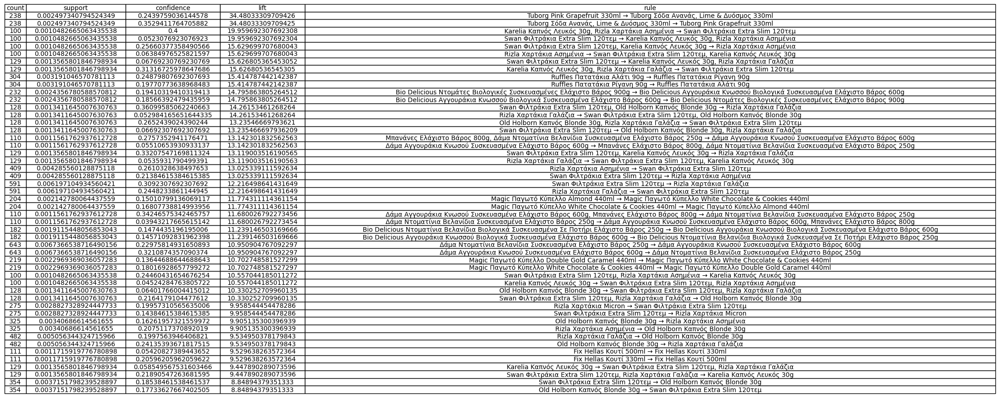

In [49]:
# Extract relevant columns
table_data = rules_filtered[['antecedents', 'consequents', 'support', 'confidence', 'lift']]

# Convert sets of items into strings for readability
table_data['antecedents'] = table_data['antecedents'].apply(lambda x: ', '.join(list(x)))
table_data['consequents'] = table_data['consequents'].apply(lambda x: ', '.join(list(x)))

# Set rule depiction
table_data['rule'] = table_data['antecedents'] + ' → ' + table_data['consequents']

# Calculate the number of times a rule has been applied (absolute support count)
table_data['count'] = (table_data['support'] * len(fd['order_id'].unique())).astype(int)

# Change column order to display the count first
table_data = table_data[['count', 'support', 'confidence', 'lift', 'rule']]

# Sort by lift in descending order
table_data = table_data.sort_values(by='lift', ascending=False)

# Filter the top 50 rules by lift
top_50_rules = table_data.sort_values(by='lift', ascending=False).head(50)

# Convert to string format for display
fig, ax = plt.subplots(figsize=(12, 8))
ax.axis('tight')
ax.axis('off')

# Create a table
table = ax.table(cellText=top_50_rules.values,
                 colLabels=top_50_rules.columns,
                 cellLoc='center',
                 loc='center')

# Adjust table font size
table.auto_set_font_size(False)
table.set_fontsize(10)
table.auto_set_column_width(col=list(range(len(top_50_rules.columns))))

plt.show()



Let's analyze the dataset to ensure it includes enough multi-item transactions:

In [50]:
# Filter rules where the antecedents contain more than one item
multi_antecedent_rules = rules_filtered[rules_filtered['antecedents'].apply(lambda x: len(x) > 1)]
print(multi_antecedent_rules[['antecedents', 'consequents', 'support', 'confidence', 'lift']].to_string())


                                                                                                               antecedents                                                   consequents   support  confidence       lift
430                                                          (Swan Φιλτράκια Extra Slim 120τεμ, Karelia Καπνός Λευκός 30g)                                     (Rizla Χαρτάκια Ασημένια)  0.001048    0.256604  15.629700
431                                                            (Swan Φιλτράκια Extra Slim 120τεμ, Rizla Χαρτάκια Ασημένια)                                   (Karelia Καπνός Λευκός 30g)  0.001048    0.244604  10.557044
432                                                                   (Karelia Καπνός Λευκός 30g, Rizla Χαρτάκια Ασημένια)                            (Swan Φιλτράκια Extra Slim 120τεμ)  0.001048    0.400000  19.959692
436                                                          (Swan Φιλτράκια Extra Slim 120τεμ, Karelia Καπνός Λευκός 30g)      

Market Basket Analysis (MBA) separately for each customer cluster:

In [51]:
# Function to filter top products, apply Apriori, and generate rules
def cluster_mba_analysis(cluster_data, top_n=100, min_support=0.001, min_confidence=0.005):
    # Filter top N products
    top_products = cluster_data['product_name'].value_counts().head(top_n).index
    filtered_data = cluster_data[cluster_data['product_name'].isin(top_products)]

    # Create transactions and re-encode
    transactions_filtered = filtered_data.groupby('order_id')['product_name'].apply(list).reset_index(name='products')
    te_ary = te.fit(transactions_filtered['products']).transform(transactions_filtered['products'])
    df_encoded_filtered = pd.DataFrame(te_ary, columns=te.columns_)

    # Run Apriori on the reduced dataset
    frequent_itemsets_filtered = apriori(df_encoded_filtered, min_support=min_support, use_colnames=True)
    rules_filtered = association_rules(frequent_itemsets_filtered, metric="confidence", min_threshold=min_confidence, num_itemsets=len(frequent_itemsets_filtered))
    
    return rules_filtered

# Separate data by clusters
loyalists_data = fd[fd['cluster_label'] == 1]
potential_loyalists_data = fd[fd['cluster_label'] == 3]
churners_data = fd[fd['cluster_label'] == 2]

# Apply MBA for each cluster
print("Running MBA for Loyalists...")
loyalists_rules = cluster_mba_analysis(loyalists_data)
print("Loyalists Rules:\n", loyalists_rules)

print("Running MBA for Potential Loyalists...")
potential_loyalists_rules = cluster_mba_analysis(potential_loyalists_data)
print("Potential Loyalists Rules:\n", potential_loyalists_rules)

print("Running MBA for Churners...")
churners_rules = cluster_mba_analysis(churners_data)
print("Churners Rules:\n", churners_rules)


Running MBA for Loyalists...
Loyalists Rules:
                                                                                    antecedents  \
0                                                       (Magic Παγωτό Πύραυλος Αμύγδαλο 160ml)   
1                                                       (Algida Παγωτό Sandwich Vanilla 100ml)   
2                (Bio Delicious Αγγουράκια Κνωσσού Βιολογικά Συσκευασμένα Ελάχιστο Βάρος 600g)   
3              (Bio Delicious Μπανάνες Εισαγωγής Βιολογικές Συσκευασμένες Ελάχιστο Bάρος 800g)   
4    (Bio Delicious Ντοματίνια Βελανίδια Βιολογικά Συσκευασμένα Σε Ποτήρι Ελάχιστο Βάρος 250g)   
5                (Bio Delicious Αγγουράκια Κνωσσού Βιολογικά Συσκευασμένα Ελάχιστο Βάρος 600g)   
6                (Bio Delicious Αγγουράκια Κνωσσού Βιολογικά Συσκευασμένα Ελάχιστο Βάρος 600g)   
7                                 (Δάμα Ντοματίνια Βελανίδια Συσκευασμένα Ελάχιστο Βάρος 250g)   
8                (Bio Delicious Αγγουράκια Κνωσσού Βιολογικά Συσκευασμέ

Visualizing rules for Loyalists...


C:\Users\User\AppData\Local\Temp\ipykernel_18892\681992074.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  table_data['antecedents'] = table_data['antecedents'].apply(lambda x: ', '.join(list(x)))
C:\Users\User\AppData\Local\Temp\ipykernel_18892\681992074.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  table_data['consequents'] = table_data['consequents'].apply(lambda x: ', '.join(list(x)))
C:\Users\User\AppData\Local\Temp\ipykernel_18892\681992074.py:11: SettingWithCopyWarning: 
A value is trying t

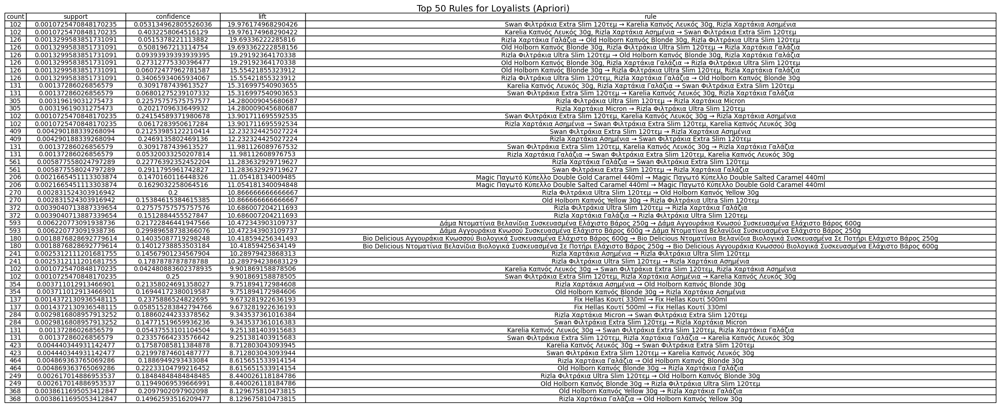

Visualizing rules for Potential Loyalists...


C:\Users\User\AppData\Local\Temp\ipykernel_18892\681992074.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  table_data['antecedents'] = table_data['antecedents'].apply(lambda x: ', '.join(list(x)))
C:\Users\User\AppData\Local\Temp\ipykernel_18892\681992074.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  table_data['consequents'] = table_data['consequents'].apply(lambda x: ', '.join(list(x)))
C:\Users\User\AppData\Local\Temp\ipykernel_18892\681992074.py:11: SettingWithCopyWarning: 
A value is trying t

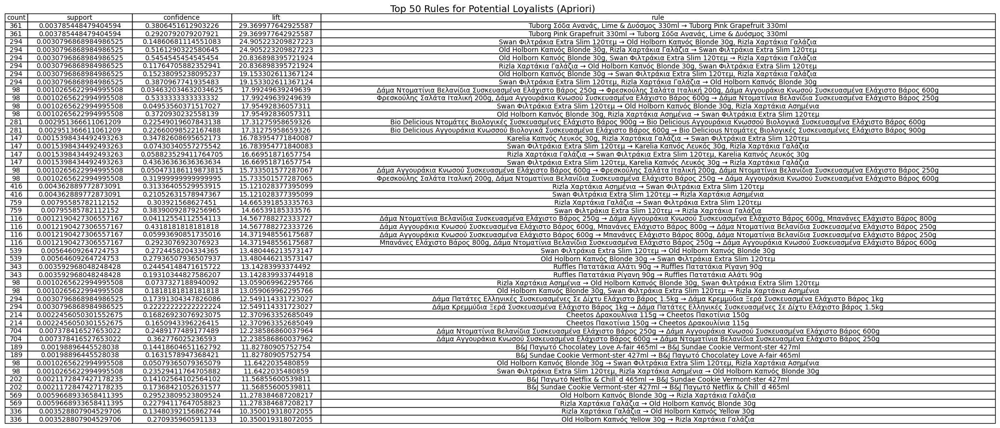

Visualizing rules for Churners...


C:\Users\User\AppData\Local\Temp\ipykernel_18892\681992074.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  table_data['antecedents'] = table_data['antecedents'].apply(lambda x: ', '.join(list(x)))
C:\Users\User\AppData\Local\Temp\ipykernel_18892\681992074.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  table_data['consequents'] = table_data['consequents'].apply(lambda x: ', '.join(list(x)))
C:\Users\User\AppData\Local\Temp\ipykernel_18892\681992074.py:11: SettingWithCopyWarning: 
A value is trying t

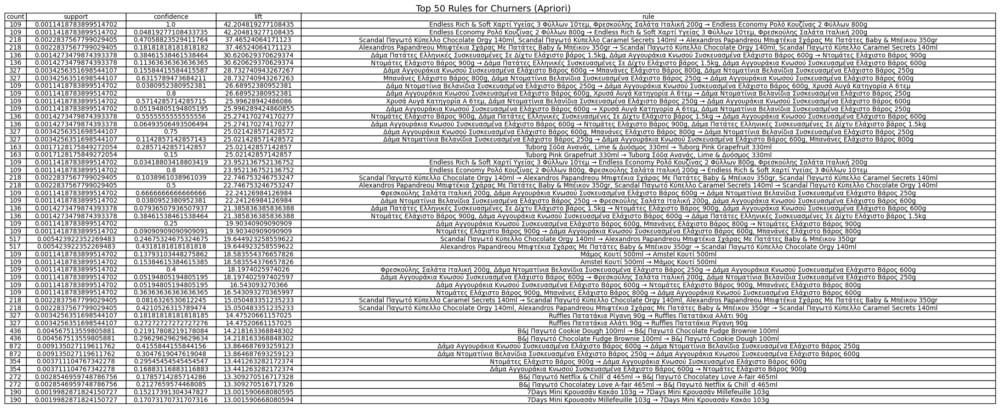

In [52]:
# Function to process rules for visualization
def visualize_cluster_rules(rules_filtered, cluster_name):
    # Extract relevant columns
    table_data = rules_filtered[['antecedents', 'consequents', 'support', 'confidence', 'lift']]

    # Convert sets of items into strings for readability
    table_data['antecedents'] = table_data['antecedents'].apply(lambda x: ', '.join(list(x)))
    table_data['consequents'] = table_data['consequents'].apply(lambda x: ', '.join(list(x)))

    # Set rule depiction
    table_data['rule'] = table_data['antecedents'] + ' → ' + table_data['consequents']

    # Calculate the number of times a rule has been applied (absolute support count)
    table_data['count'] = (table_data['support'] * len(fd['order_id'].unique())).astype(int)

    # Change column order to display the count first
    table_data = table_data[['count', 'support', 'confidence', 'lift', 'rule']]

    # Sort by lift in descending order
    table_data = table_data.sort_values(by='lift', ascending=False)

    # Filter the top 50 rules by lift
    top_50_rules = table_data.head(50)

    # Visualize the table
    fig, ax = plt.subplots(figsize=(12, 8))
    ax.axis('tight')
    ax.axis('off')

    # Create a table
    table = ax.table(cellText=top_50_rules.values,
                     colLabels=top_50_rules.columns,
                     cellLoc='center',
                     loc='center')

    # Adjust table font size
    table.auto_set_font_size(False)
    table.set_fontsize(10)
    table.auto_set_column_width(col=list(range(len(top_50_rules.columns))))

    # Add a title above the table
    plt.suptitle(f"Top 50 Rules for {cluster_name} (Apriori)", fontsize=14, y=1.05)  # Adjust 'y' for vertical placement
    plt.show()

# Visualize rules for each cluster
print("Visualizing rules for Loyalists...")
visualize_cluster_rules(loyalists_rules, "Loyalists")

print("Visualizing rules for Potential Loyalists...")
visualize_cluster_rules(potential_loyalists_rules, "Potential Loyalists")

print("Visualizing rules for Churners...")
visualize_cluster_rules(churners_rules, "Churners")


We apply analysis to the top 10 products for computational reasons

C:\Users\User\AppData\Local\Temp\ipykernel_18892\4149392352.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


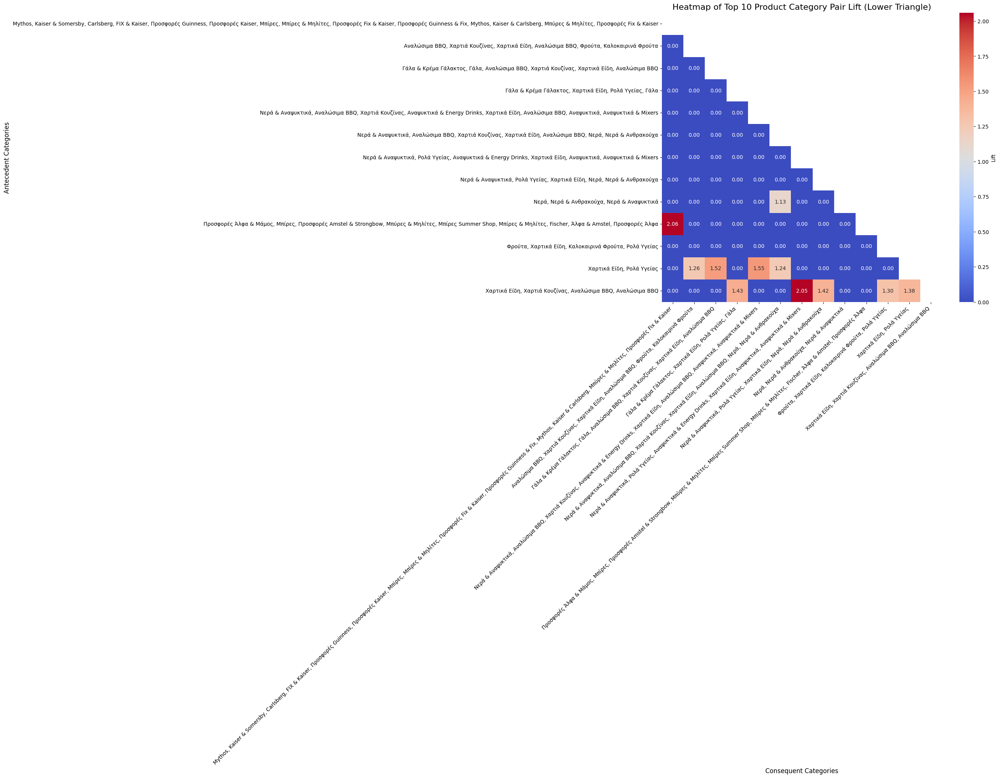

In [53]:
# Step 1: Filter to the top 10 products
top_products = fd['product_name'].value_counts().head(10).index
filtered_data = fd[fd['product_name'].isin(top_products)]

# Step 2: Create transactions for filtered data
transactions = filtered_data.groupby('order_id')['product_name'].apply(list).reset_index(name='products')

# Step 3: One-hot encode the filtered transactions
te = TransactionEncoder()
te_ary = te.fit(transactions['products']).transform(transactions['products'])
df_encoded = pd.DataFrame(te_ary, columns=te.columns_)

# Step 4: Apply Apriori to generate frequent itemsets
frequent_itemsets = apriori(df_encoded, min_support=0.001, use_colnames=True)

# Step 5: Generate association rules
rules = association_rules(frequent_itemsets, metric="lift", min_threshold=1, num_itemsets=len(frequent_itemsets))

# Step 6: Map antecedents and consequents to product categories
product_categories = filtered_data[['product_name', 'product_category']].drop_duplicates()

rules['antecedent_categories'] = rules['antecedents'].apply(
    lambda x: ', '.join(set(product_categories.loc[product_categories['product_name'].isin(x), 'product_category']))
)
rules['consequent_categories'] = rules['consequents'].apply(
    lambda x: ', '.join(set(product_categories.loc[product_categories['product_name'].isin(x), 'product_category']))
)

# Step 7: Group by categories and calculate the mean lift for each category pair
category_lift = rules.groupby(['antecedent_categories', 'consequent_categories'])['lift'].mean().unstack(fill_value=0)

# Step 8: Create a mask for the upper triangle
mask = np.triu(np.ones_like(category_lift, dtype=bool))

# Step 9: Plot the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(category_lift, mask=mask, annot=True, fmt=".2f", cmap='coolwarm', cbar_kws={'label': 'Lift'})
plt.title('Heatmap of Top 10 Product Category Pair Lift (Lower Triangle)', fontsize=16)
plt.xlabel('Consequent Categories', fontsize=12)
plt.ylabel('Antecedent Categories', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


C:\Users\User\AppData\Local\Temp\ipykernel_18892\1076637831.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['Customer Cluster'] = filtered_data['Customer Cluster'].map(cluster_mapping)


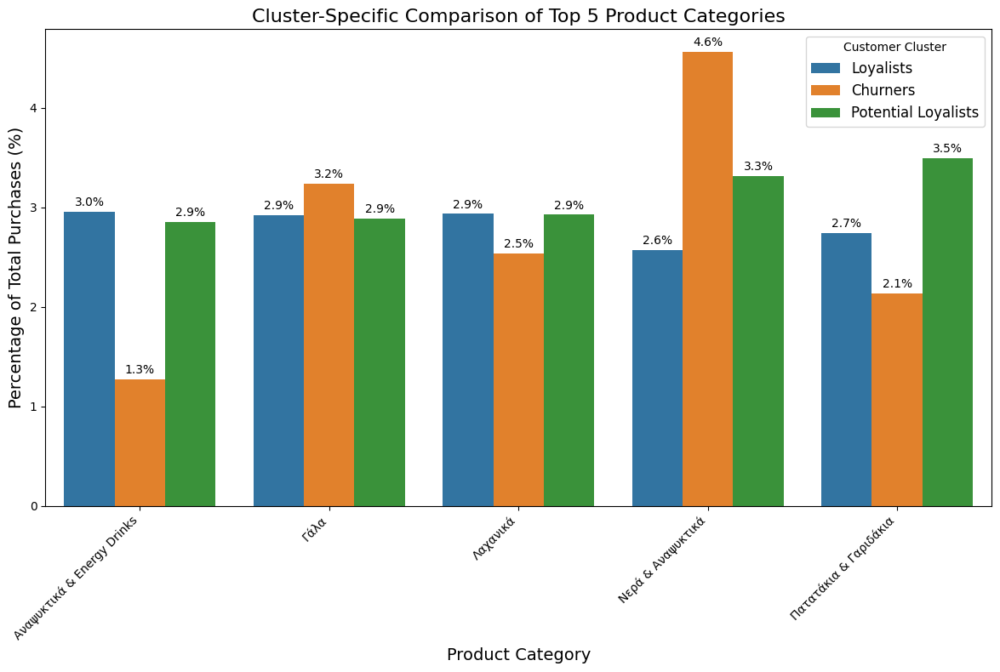

In [54]:
# Grouping by cluster and product category, then counting the purchases
category_counts = fd.groupby(['cluster_label', 'product_category'])['order_id'].count().reset_index()
category_counts.columns = ['Customer Cluster', 'Product Category', 'Count']

# Calculating the total purchases per cluster
total_counts = category_counts.groupby('Customer Cluster')['Count'].sum().reset_index()
total_counts.columns = ['Customer Cluster', 'Total Purchases']

# Merging to calculate percentage of total purchases for each category within each cluster
category_counts = pd.merge(category_counts, total_counts, on='Customer Cluster')
category_counts['Percentage of Total Purchases'] = (category_counts['Count'] / category_counts['Total Purchases']) * 100

# Filtering top 5 product categories across all clusters
top_categories = category_counts.groupby('Product Category')['Count'].sum().nlargest(5).index
filtered_data = category_counts[category_counts['Product Category'].isin(top_categories)]

# Rename clusters for clarity
cluster_mapping = {1: 'Loyalists', 3: 'Potential Loyalists', 2: 'Churners'}
filtered_data['Customer Cluster'] = filtered_data['Customer Cluster'].map(cluster_mapping)

# Create the bar plot
plt.figure(figsize=(12, 8))
ax = sns.barplot(x='Product Category', y='Percentage of Total Purchases', hue='Customer Cluster', data=filtered_data)

# Add data labels
for p in ax.patches:
    ax.annotate(f'{p.get_height():.1f}%', 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='baseline', fontsize=10, color='black', xytext=(0, 5), 
                textcoords='offset points')

# Set plot title and labels
plt.title('Cluster-Specific Comparison of Top 5 Product Categories', fontsize=16)
plt.xlabel('Product Category', fontsize=14)
plt.ylabel('Percentage of Total Purchases (%)', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.legend(title='Customer Cluster', fontsize=12)
plt.tight_layout()

# Show the plot
plt.show()


C:\Users\User\AppData\Local\Temp\ipykernel_18892\811310824.py:46: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm)


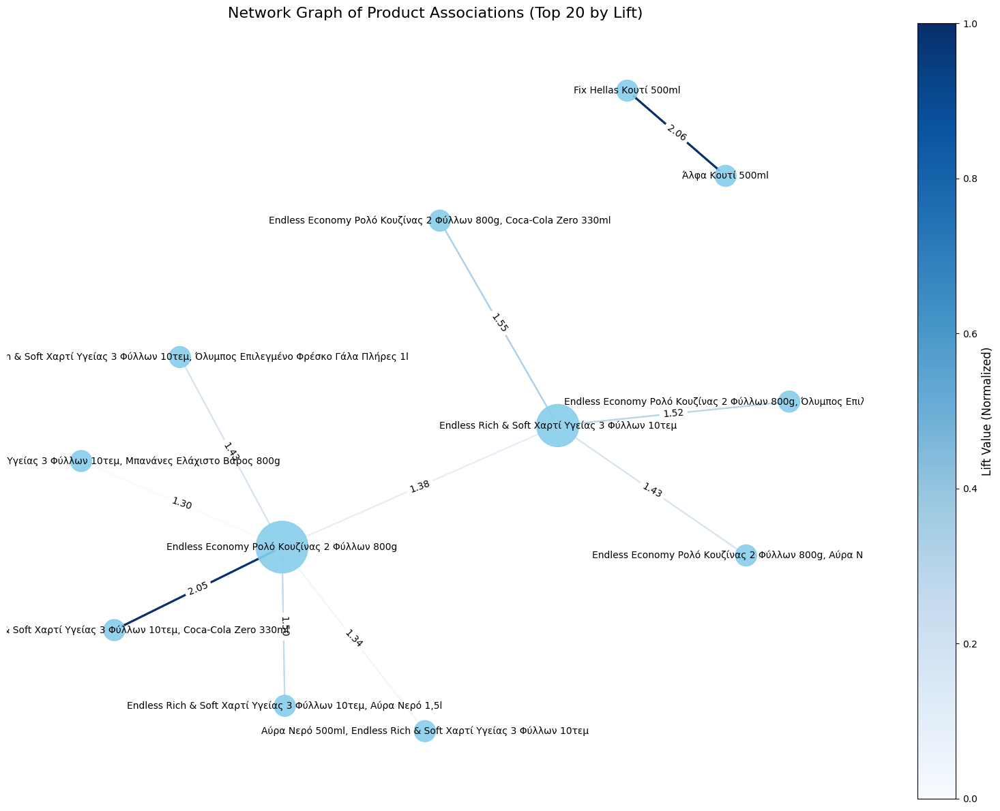

In [55]:
# Filter the rules to select top N associations by lift
top_n = 20  # You can adjust this value
filtered_rules = rules.sort_values(by='lift', ascending=False).head(top_n)


# Create a directed graph
G = nx.DiGraph()

# Add edges to the graph based on the filtered rules
for _, rule in filtered_rules.iterrows():
    antecedents = ', '.join(list(rule['antecedents']))
    consequents = ', '.join(list(rule['consequents']))
    lift = rule['lift']
    G.add_edge(antecedents, consequents, weight=lift)

# Set graph layout with increased spacing
pos = nx.spring_layout(G, seed=42, k=1)  # Adjust k for spacing

# Calculate node degrees and edge weights for scaling
node_sizes = [len(list(G.neighbors(n))) * 500 for n in G.nodes()]
edge_weights = [d['weight'] for _, _, d in G.edges(data=True)]

# Normalize edge weights for color mapping
norm_weights = np.array(edge_weights)
norm_weights = (norm_weights - norm_weights.min()) / (norm_weights.max() - norm_weights.min())

# Draw nodes
plt.figure(figsize=(16, 12))
nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color='skyblue', alpha=0.9)

# Draw edges with color mapping
edges = nx.draw_networkx_edges(
    G, pos, edge_color=norm_weights, edge_cmap=cm.Blues, width=[w for w in edge_weights], arrowsize=2
)

# Draw labels with optimized font size
nx.draw_networkx_labels(G, pos, font_size=10, font_weight='normal')

# Add edge labels for lift values
edge_labels = {(u, v): f"{d['weight']:.2f}" for u, v, d in G.edges(data=True)}
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_size=10, label_pos=0.5)

# Add a colorbar for edge weights
sm = plt.cm.ScalarMappable(cmap=cm.Blues, norm=plt.Normalize(vmin=norm_weights.min(), vmax=norm_weights.max()))
sm.set_array([])
cbar = plt.colorbar(sm)
cbar.set_label('Lift Value (Normalized)', fontsize=12)

# Add a title and display the graph
plt.title('Network Graph of Product Associations (Top 20 by Lift)', fontsize=16)
plt.axis('off')
plt.tight_layout()
plt.show()


FP-Growth implementation

In [56]:
# Ensure dataset is in transactional format (assuming `fd` is the dataset)
# Transform the dataset to a transactional format suitable for FP-Growth
basket = fd.groupby(['order_id', 'product_name'])['items_sold'].sum().unstack().fillna(0)
basket = basket.applymap(lambda x: 1 if x > 0 else 0)

# Apply FP-Growth algorithm to generate frequent itemsets
min_support = 0.001  # Adjust this value if needed
frequent_itemsets = fpgrowth(basket, min_support=min_support, use_colnames=True)

# Generate association rules from frequent itemsets
rules = association_rules(frequent_itemsets, metric="lift", min_threshold=1, num_itemsets=len(frequent_itemsets))

# Sort the rules by lift in descending order
sorted_rules = rules.sort_values(by='lift', ascending=False)

# Display the top 20 rules for a quick preview
print(sorted_rules.head(20).to_string())

# Save the rules to a CSV file (optional)
sorted_rules.to_csv('fp_growth_rules.csv', index=False)



c:\Users\User\AppData\Local\Programs\Python\Python39\lib\site-packages\mlxtend\frequent_patterns\fpcommon.py:161: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


                                                                                            antecedents                                                                                         consequents  antecedent support  consequent support   support  confidence        lift  representativity  leverage  conviction  zhangs_metric   jaccard  certainty  kulczynski
353                                                 (Vitamin Well Βιταμινούχο Ρόφημα Antioxidant 500ml)                                                      (Vitamin Well Βιταμινούχο Ρόφημα Reload 500ml)            0.003090            0.001854  0.001152    0.372881  201.145265               1.0  0.001146    1.591639       0.998112  0.303867   0.371717    0.497175
352                                                      (Vitamin Well Βιταμινούχο Ρόφημα Reload 500ml)                                                 (Vitamin Well Βιταμινούχο Ρόφημα Antioxidant 500ml)            0.001854            0.003090  0.001152    0.621469  2

In [57]:
print(f"Number of rules: {len(sorted_rules)}")

Number of rules: 370


In [58]:
# Display generated rules with lift > 2
high_lift_rules = sorted_rules[sorted_rules['lift'] > 100]
print(f"Number of high-lift rules (>100): {len(high_lift_rules)}")
print(high_lift_rules.to_string())


Number of high-lift rules (>100): 14
                                                                                            antecedents                                                                                         consequents  antecedent support  consequent support   support  confidence        lift  representativity  leverage  conviction  zhangs_metric   jaccard  certainty  kulczynski
353                                                 (Vitamin Well Βιταμινούχο Ρόφημα Antioxidant 500ml)                                                      (Vitamin Well Βιταμινούχο Ρόφημα Reload 500ml)            0.003090            0.001854  0.001152    0.372881  201.145265               1.0  0.001146    1.591639       0.998112  0.303867   0.371717    0.497175
352                                                      (Vitamin Well Βιταμινούχο Ρόφημα Reload 500ml)                                                 (Vitamin Well Βιταμινούχο Ρόφημα Antioxidant 500ml)            0.001854        

In [59]:
# Coverage Across Product Categories:
unique_products = set()
for rule in sorted_rules['antecedents']:
    unique_products.update(rule)
for rule in sorted_rules['consequents']:
    unique_products.update(rule)
print(f"Number of unique products in rules: {len(unique_products)}")


Number of unique products in rules: 131


In [60]:
# Higher support means the rule applies to a larger portion of transactions. Should have a balance of high-support and niche (low-support) rules
print(sorted_rules['support'].describe())


count    370.000000
mean       0.001567
std        0.000715
min        0.001005
25%        0.001142
50%        0.001372
75%        0.001697
max        0.007164
Name: support, dtype: float64


In [61]:
# Confidence indicates the probability that the consequent is purchased when the antecedent is purchased
print(sorted_rules['confidence'].describe())


count    370.000000
mean       0.141993
std        0.109455
min        0.022346
25%        0.063423
50%        0.119933
75%        0.181600
max        0.674009
Name: confidence, dtype: float64


C:\Users\User\AppData\Local\Temp\ipykernel_18892\1465916073.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fp_growth_table_data['antecedents'] = fp_growth_table_data['antecedents'].apply(lambda x: ', '.join(list(x)))
C:\Users\User\AppData\Local\Temp\ipykernel_18892\1465916073.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fp_growth_table_data['consequents'] = fp_growth_table_data['consequents'].apply(lambda x: ', '.join(list(x)))
C:\Users\User\AppData\Local\Temp\ipykernel_18892\1465916073.py:9: Se

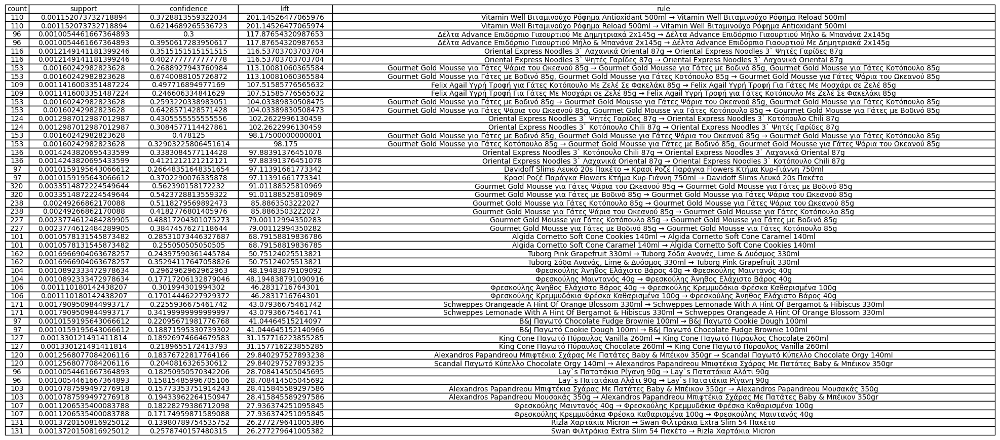

In [62]:
# Extract relevant columns from the FP-Growth rules
fp_growth_table_data = rules[['antecedents', 'consequents', 'support', 'confidence', 'lift']]

# Convert sets of items into strings for readability
fp_growth_table_data['antecedents'] = fp_growth_table_data['antecedents'].apply(lambda x: ', '.join(list(x)))
fp_growth_table_data['consequents'] = fp_growth_table_data['consequents'].apply(lambda x: ', '.join(list(x)))

# Set rule depiction
fp_growth_table_data['rule'] = fp_growth_table_data['antecedents'] + ' → ' + fp_growth_table_data['consequents']

# Calculate the number of times a rule has been applied (absolute support count)
fp_growth_table_data['count'] = (fp_growth_table_data['support'] * len(fd['order_id'].unique())).astype(int)

# Change column order to display the count first
fp_growth_table_data = fp_growth_table_data[['count', 'support', 'confidence', 'lift', 'rule']]

# Sort by lift in descending order
fp_growth_table_data = fp_growth_table_data.sort_values(by='lift', ascending=False)

# Filter the top 50 rules by lift
fp_growth_top_50_rules = fp_growth_table_data.head(50)

# Convert to string format for display
fig, ax = plt.subplots(figsize=(12, 8))
ax.axis('tight')
ax.axis('off')

# Create a table
table = ax.table(cellText=fp_growth_top_50_rules.values,
                 colLabels=fp_growth_top_50_rules.columns,
                 cellLoc='center',
                 loc='center')

# Adjust table font size
table.auto_set_font_size(False)
table.set_fontsize(10)
table.auto_set_column_width(col=list(range(len(fp_growth_top_50_rules.columns))))

plt.show()


In [63]:
print(fp_growth_top_50_rules.sort_values(by='lift', ascending=False).head(20).to_string(index=False))


 count  support  confidence       lift                                                                                                                                           rule
   110 0.001152    0.372881 201.145265                                               Vitamin Well Βιταμινούχο Ρόφημα Antioxidant 500ml → Vitamin Well Βιταμινούχο Ρόφημα Reload 500ml
   110 0.001152    0.621469 201.145265                                               Vitamin Well Βιταμινούχο Ρόφημα Reload 500ml → Vitamin Well Βιταμινούχο Ρόφημα Antioxidant 500ml
    96 0.001005    0.300000 117.876543                             Δέλτα Advance Επιδόρπιο Γιαουρτιού Με Δημητριακά 2x145g → Δέλτα Advance Επιδόρπιο Γιαουρτιού Μήλο & Μπανάνα 2x145g
    96 0.001005    0.395062 117.876543                             Δέλτα Advance Επιδόρπιο Γιαουρτιού Μήλο & Μπανάνα 2x145g → Δέλτα Advance Επιδόρπιο Γιαουρτιού Με Δημητριακά 2x145g
   116 0.001215    0.351515 116.537037                                              Orient

c:\Users\User\AppData\Local\Programs\Python\Python39\lib\site-packages\mlxtend\frequent_patterns\fpcommon.py:161: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(
c:\Users\User\AppData\Local\Programs\Python\Python39\lib\site-packages\mlxtend\frequent_patterns\fpcommon.py:161: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(
c:\Users\User\AppData\Local\Programs\Python\Python39\lib\site-packages\mlxtend\frequent_patterns\fpcommon.py:161: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


Visualizing FP-Growth rules for Loyalists...


C:\Users\User\AppData\Local\Temp\ipykernel_18892\1753922554.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fp_growth_table_data['antecedents'] = fp_growth_table_data['antecedents'].apply(lambda x: ', '.join(list(x)))
C:\Users\User\AppData\Local\Temp\ipykernel_18892\1753922554.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fp_growth_table_data['consequents'] = fp_growth_table_data['consequents'].apply(lambda x: ', '.join(list(x)))
C:\Users\User\AppData\Local\Temp\ipykernel_18892\1753922554.py:30:

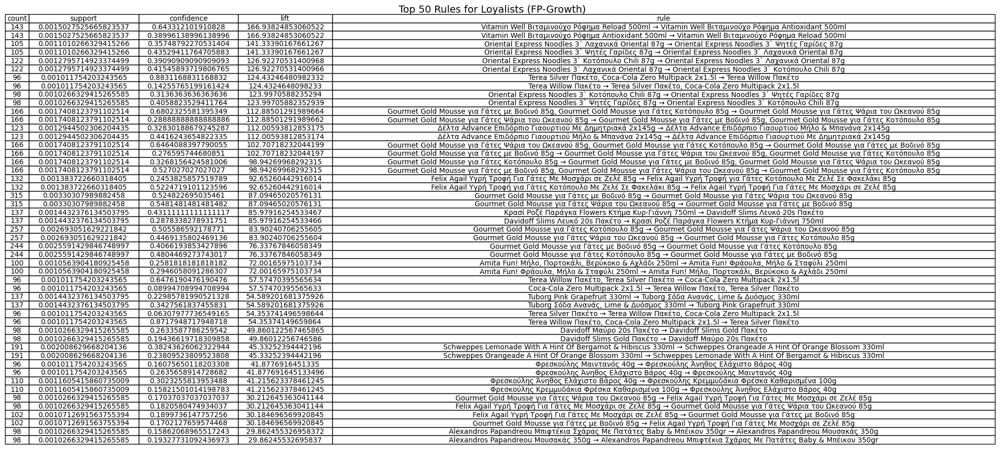

Visualizing FP-Growth rules for Potential Loyalists...


C:\Users\User\AppData\Local\Temp\ipykernel_18892\1753922554.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fp_growth_table_data['antecedents'] = fp_growth_table_data['antecedents'].apply(lambda x: ', '.join(list(x)))
C:\Users\User\AppData\Local\Temp\ipykernel_18892\1753922554.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fp_growth_table_data['consequents'] = fp_growth_table_data['consequents'].apply(lambda x: ', '.join(list(x)))
C:\Users\User\AppData\Local\Temp\ipykernel_18892\1753922554.py:30:

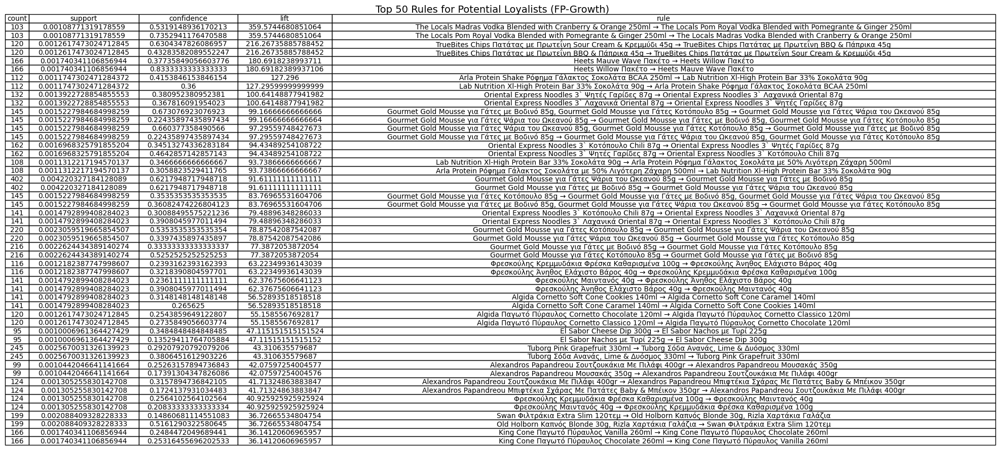

Visualizing FP-Growth rules for Churners...


C:\Users\User\AppData\Local\Temp\ipykernel_18892\1753922554.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fp_growth_table_data['antecedents'] = fp_growth_table_data['antecedents'].apply(lambda x: ', '.join(list(x)))
C:\Users\User\AppData\Local\Temp\ipykernel_18892\1753922554.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fp_growth_table_data['consequents'] = fp_growth_table_data['consequents'].apply(lambda x: ', '.join(list(x)))
C:\Users\User\AppData\Local\Temp\ipykernel_18892\1753922554.py:30:

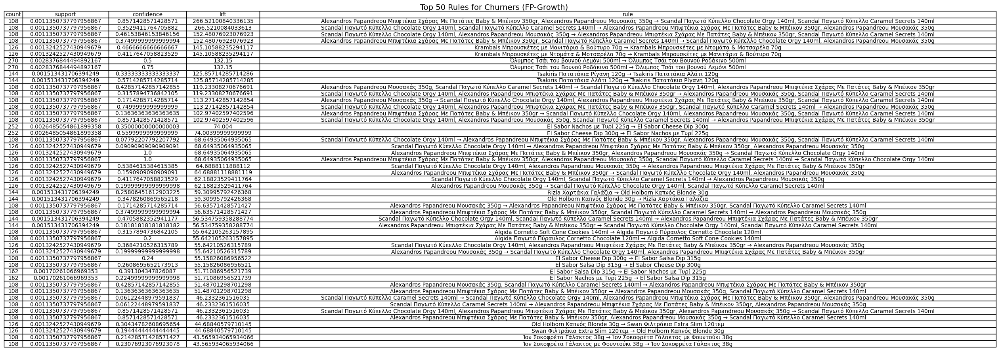

In [64]:
# Function to preprocess and apply FP-Growth for a specific cluster
def apply_fp_growth_for_cluster(cluster_data, min_support=0.001):
    # Ensure dataset is in transactional format for the cluster
    basket_cluster = cluster_data.groupby(['order_id', 'product_name'])['items_sold'].sum().unstack().fillna(0)
    basket_cluster = basket_cluster.applymap(lambda x: 1 if x > 0 else 0)
    
    # Apply FP-Growth algorithm
    frequent_itemsets_cluster = fpgrowth(basket_cluster, min_support=min_support, use_colnames=True)
    
    # Generate association rules
    rules_cluster = association_rules(frequent_itemsets_cluster, metric="lift", min_threshold=1, num_itemsets=len(frequent_itemsets))
    
    return rules_cluster

# Apply FP-Growth to each cluster
loyalists_data = fd[fd['cluster_label'] == 1]
potential_loyalists_data = fd[fd['cluster_label'] == 3]
churners_data = fd[fd['cluster_label'] == 2]

loyalists_rules = apply_fp_growth_for_cluster(loyalists_data)
potential_loyalists_rules = apply_fp_growth_for_cluster(potential_loyalists_data)
churners_rules = apply_fp_growth_for_cluster(churners_data)

# Function to visualize the top 50 rules for each cluster
def visualize_fp_growth_cluster_rules(rules_filtered, cluster_name):
    # Extract relevant columns
    fp_growth_table_data = rules_filtered[['antecedents', 'consequents', 'support', 'confidence', 'lift']]
    fp_growth_table_data['antecedents'] = fp_growth_table_data['antecedents'].apply(lambda x: ', '.join(list(x)))
    fp_growth_table_data['consequents'] = fp_growth_table_data['consequents'].apply(lambda x: ', '.join(list(x)))
    fp_growth_table_data['rule'] = fp_growth_table_data['antecedents'] + ' → ' + fp_growth_table_data['consequents']
    fp_growth_table_data['count'] = (fp_growth_table_data['support'] * len(fd['order_id'].unique())).astype(int)
    fp_growth_table_data = fp_growth_table_data[['count', 'support', 'confidence', 'lift', 'rule']]
    fp_growth_table_data = fp_growth_table_data.sort_values(by='lift', ascending=False)
    top_50_rules = fp_growth_table_data.head(50)
    
    # Visualize the table
    fig, ax = plt.subplots(figsize=(12, 8))
    ax.axis('tight')
    ax.axis('off')
    table = ax.table(cellText=top_50_rules.values,
                     colLabels=top_50_rules.columns,
                     cellLoc='center',
                     loc='center')
    table.auto_set_font_size(False)
    table.set_fontsize(10)
    table.auto_set_column_width(col=list(range(len(top_50_rules.columns))))
    plt.suptitle(f"Top 50 Rules for {cluster_name} (FP-Growth)", fontsize=14, y=1.05)
    plt.show()

# Visualize FP-Growth rules for each cluster
print("Visualizing FP-Growth rules for Loyalists...")
visualize_fp_growth_cluster_rules(loyalists_rules, "Loyalists")

print("Visualizing FP-Growth rules for Potential Loyalists...")
visualize_fp_growth_cluster_rules(potential_loyalists_rules, "Potential Loyalists")

print("Visualizing FP-Growth rules for Churners...")
visualize_fp_growth_cluster_rules(churners_rules, "Churners")


C:\Users\User\AppData\Local\Temp\ipykernel_18892\1869239145.py:27: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


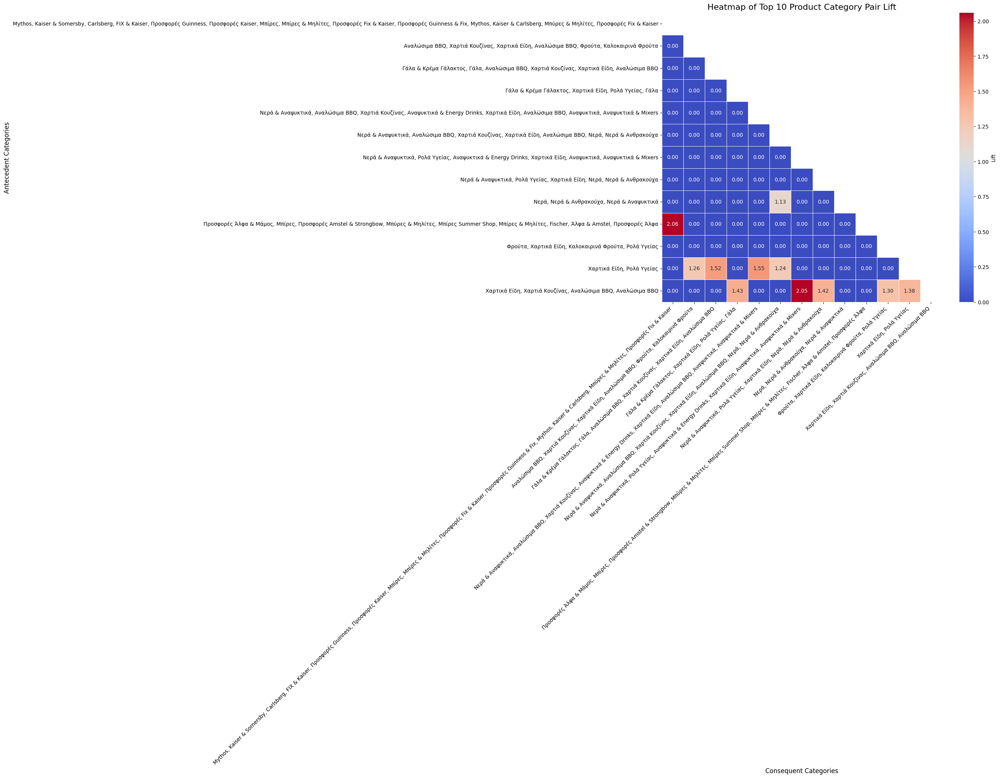

In [65]:
# Generate heatmap data from FP-Growth rules
# category_lift = rules.groupby(['antecedent_categories', 'consequent_categories'])['lift'].mean().unstack(fill_value=0)

# Create a mask for the upper triangle
mask = np.triu(np.ones_like(category_lift, dtype=bool))

# Set up the matplotlib figure
plt.figure(figsize=(12, 10))

# Draw the heatmap with the mask
sns.heatmap(
    category_lift,
    mask=mask,
    cmap='coolwarm',
    annot=True,
    fmt=".2f",
    cbar_kws={'label': 'Lift'},
    linewidths=0.5
)

# Customize the plot
plt.title('Heatmap of Top 10 Product Category Pair Lift', fontsize=16)
plt.xlabel('Consequent Categories', fontsize=12)
plt.ylabel('Antecedent Categories', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()

# Show the plot
plt.show()


C:\Users\User\AppData\Local\Temp\ipykernel_18892\2547243106.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data_fp['Customer Cluster'] = filtered_data_fp['Customer Cluster'].map(cluster_mapping_fp)


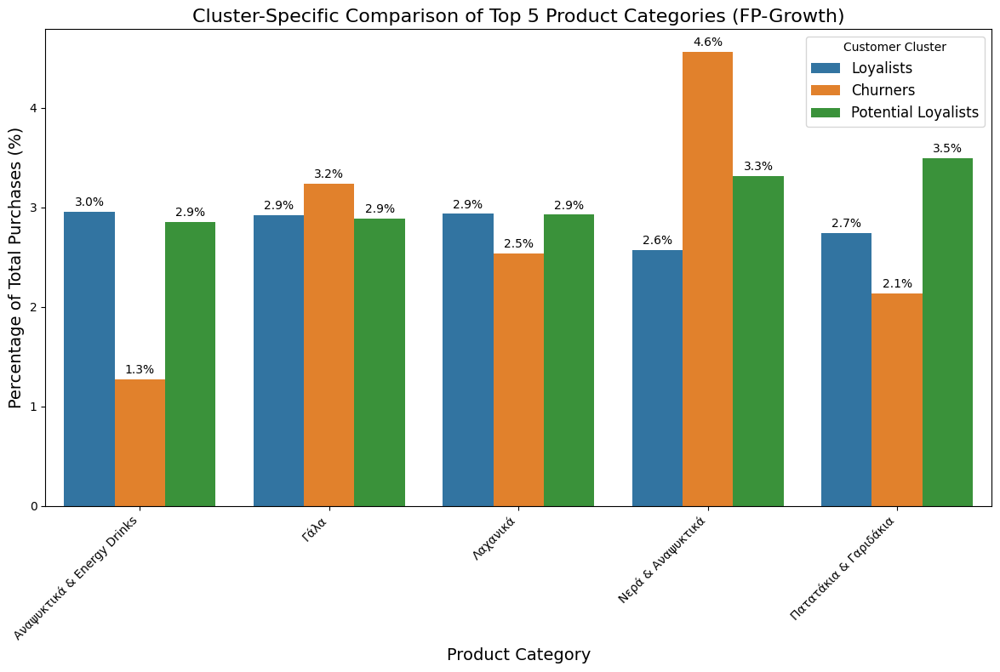

In [66]:
# Grouping by cluster and product category, then counting the purchases
category_counts_fp = fd.groupby(['cluster_label', 'product_category'])['order_id'].count().reset_index()
category_counts_fp.columns = ['Customer Cluster', 'Product Category', 'Count']

# Calculating the total purchases per cluster
total_counts_fp = category_counts_fp.groupby('Customer Cluster')['Count'].sum().reset_index()
total_counts_fp.columns = ['Customer Cluster', 'Total Purchases']

# Merging to calculate percentage of total purchases for each category within each cluster
category_counts_fp = pd.merge(category_counts_fp, total_counts_fp, on='Customer Cluster')
category_counts_fp['Percentage of Total Purchases'] = (category_counts_fp['Count'] / category_counts_fp['Total Purchases']) * 100

# Filtering top 5 product categories across all clusters
top_categories_fp = category_counts_fp.groupby('Product Category')['Count'].sum().nlargest(5).index
filtered_data_fp = category_counts_fp[category_counts_fp['Product Category'].isin(top_categories_fp)]

# Rename clusters for clarity
cluster_mapping_fp = {1: 'Loyalists', 3: 'Potential Loyalists', 2: 'Churners'}
filtered_data_fp['Customer Cluster'] = filtered_data_fp['Customer Cluster'].map(cluster_mapping_fp)

# Create the bar plot
plt.figure(figsize=(12, 8))
ax_fp = sns.barplot(x='Product Category', y='Percentage of Total Purchases', hue='Customer Cluster', data=filtered_data_fp)

# Add data labels
for p in ax_fp.patches:
    ax_fp.annotate(f'{p.get_height():.1f}%', 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha='center', va='baseline', fontsize=10, color='black', xytext=(0, 5), 
                   textcoords='offset points')

# Set plot title and labels
plt.title('Cluster-Specific Comparison of Top 5 Product Categories (FP-Growth)', fontsize=16)
plt.xlabel('Product Category', fontsize=14)
plt.ylabel('Percentage of Total Purchases (%)', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.legend(title='Customer Cluster', fontsize=12)
plt.tight_layout()

# Show the plot
plt.show()
